# Exploring Patterns behind Tipping and Gratuity at Restaurants

- Many industries, such as retail, oil, and banking have their prices predetermined and set when their customers are looking to purchase

- In restaurants, it is a social norm to leave tips -- **this is a strange concept** as why don't we tip retail employees when they find a product for us or a bank teller when they help us deposit money?

- If a waiter/ waitress' income is heavily dependent on tips (which could be easily volatile, from 0% to 20%!), could we identify the variables that contribute to the tipping decision by customers?

**Objective:**
Identify variables that effect tipping percentage at restaurants

## The Approach

We will attempt to approach this analysis by doing the following:

- Identify patterns in a **visual** manner only using plots and graphs
- Identify patterns by **developing a multiple regression model**

Once we have the results of both approaches, we will compare and discuss results.

## The Dataset

To identify potential variables, we will be looking at a dataset of more than 2400 waiters/ waitresses from around the world considering variables such as:

- Region
- Customer Interactions
- Worker Traits
- Sex and Age of Worker
- Race of Both the Worker and Customer

In [86]:
# Load libraries
library(car) # Rename State names and for several plots
library(ggplot2) # Visualizations
library(reshape2) # Melt function to assist in visualizating a map of the USA
library(maps) # For USA map
library(leaps) # Subsets regression

## Import data into R

In [2]:
#setwd("C:/Users/Kevin.Nguyen/Dropbox/CKME136")
setwd("C:/Users/Kevin/Desktop/Dropbox/Dropbox/CKME136")
raw_df <- read.csv(file="server-survey.csv", head=TRUE, na.strings=c(" ", "NA"))

# Subset variables to be used in analysis
myvars <- c("State", "asian_prop", "black_prop", "hispanic_prop", "white_prop", "ppbill", 
            "pcttip", "flair", "intro", "selling", "repeat.", "customer_name", "smile",
            "thanks", "Extraverted_enthusiastic", "Critical_quarrelsome", 
            "Dependable_selfdisciplined","Anxious_easily_upset", "Reserved_quiet", 
            "Sympathetic_warm", "Disorganized_careless","Conventional_uncreative", 
            "birth_yr", "sex", "race")

df <- raw_df[myvars]

## Clean Variables

Some cleaning and changing of the variables will be required in order to ensure R understands the data.

In [3]:
# Clean variable: State
# Set variable "State" to all lowercase letters to make cleaning easier to deal with
df$State <- tolower(df$State)

In [4]:
# Rename state names in the USA using the following reference: http://www.stateabbreviations.us/
df$State <- recode(df$State, '"alabama"="al"; "alaska"="ak"; "arizona"="az"; "arkansas"="ar"; 
                   "california"="ca"; "colorado"="co"; "connecticut"="ct"; "delware"="de";
                   "florida"="fl"; "georgia"="ga"; "hawaii"="hi"; "idaho"="id";"illinois"="il"; 
                   "indiana"="in"; "iowa"="ia"; "kansas"="ks"; "kentucky"="ky"; "louisiana"="la";
                   "maine"="me"; "maryland"="md"; "massachusetts"="ma"; "michigan"="mi"; 
                   "minnesota"="mn"; "mississippi"="mn"; "missouri"="mo"; 
                   "montana"="mt"; "nebraska"="ne"; "nevada"="nv"; "new hampshire"="nh"; 
                   "new jersey"="nj"; "new mexico"="nm"; "new york"="ny"; "north carolina"="nc"; 
                   "north dakota"="nd"; "ohio"="oh"; "oklahoma"="ok"; "oregon"="or"; 
                   "pennsylvania"="pa"; "rhode island"="ri"; "south carolina"="sc"; 
                   "south dakota"="sc"; "tennessee"="tn"; "texas"="tx"; "utah"="ut"; 
                  "vermont"="vt"; "virginia"="va"; "washington"="wa";
                   "west virginia"="wv"; "wisconsin"="wi"; "wyoming"="wy"')

In [5]:
# Rename State (Province) names in Canada
df$State <- recode(df$State, '"alberta"="ab"; "british columbia"="bc"; "manitoba"="mb"; 
                   "new brunswick"="nb"; "newfoundland"="nl"; "northwest territories"="nt"; 
                   "nova scotia"="ns"; "nunavut"="nu"; "ontario"="on";
                   "prince edward island"="pe"; "quebec"="qc"; "saskatchewan"="sk"; "yukon"="yt"')

# Change all provinces and observations that have the text "canada" in them to simply "canada" 
for (province in c("ab", "bc", "mb", "nb", "nl", "nt", "ns", "nu", "on", "pe", "qc", 
                   "sk", "yt", "canada")) {
  df$State[grepl(province, df$State)] <- "canada"
}

In [6]:
# Clean variable: Proportion
df$total_prop <- df$asian_prop + df$black_prop + df$hispanic_prop + df$white_prop

In [7]:
# If total proportion is equal to or less than 1, multiply by 100 
# Why? The user inputted in percentages rather than whole numbers
# See http://stackoverflow.com/questions/30774096/based-on-the-value-in-one-column-change-the-value-in-another-column
dfprop <- df[2:5]
for (col in names(dfprop)) {
  df[[col]] <- ifelse(df$total_prop <= 1, df[[col]]*100, df[[col]])
}

In [8]:
# If total proportion is equal to or over 150, remove occurences from analysis
for (col in names(dfprop)) {
  df[[col]] <- ifelse(df$total_prop >= 150, NA, df[[col]])
}

In [9]:
# Remove total_prop column as it is no longer needed
df$total_prop <- NULL 

In [10]:
# Clean variable: ppbill
# Remove observations where the bill is equal to or under 5 dollars 
# as well as equal to or over 200 dollars
df$ppbill <- ifelse(df$ppbill <= 5 | df$ppbill >= 200, NA, df$ppbill)

In [11]:
# If tip percentage is under 1, multiply by 100 to properly fix percentage
df$pcttip <- ifelse(df$pcttip <= 1, df$pcttip*100, df$pcttip)

# Remove observations where the tip percentage is over 50 percent
df$pcttip <- ifelse(df$pcttip >= 50, NA, df$pcttip)

In [12]:
# Clean variable: Birth Year
# Remove observations where the birth year is between 100 to 1900 OR over 2000
df$birth_yr <- ifelse(df$birth_yr >= 100 & df$birth_yr <= 1900 | df$birth_yr >= 2000, NA, df$birth_yr)

# If birth year is under 100, then add 1900 as the user was inputting the last two digits 
# of their birth year only (e.g. 48 -> 1948)
df$birth_yr <- ifelse(df$birth_yr < 100, df$birth_yr + 1900, df$birth_yr)

In [13]:
# Clean variable: Customer Interaction Ratings
# Use ordered instead of factor for easier visualization
dfrating <- df[8:14]
for (col in names(dfrating)) {
  df[[col]] <- ordered(df[[col]], levels=c(1,2,3,4), labels=c("Never", "Sometimes", "Often", "Always"))
}

In [14]:
# Clean variable: Waiter traits
# Use ordered instead of factor here as well
dftrait <- df[15:22]
for (col in names(dftrait)) {
  df[[col]] <- ordered(df[[col]], levels=c(1,2,3,4,5,6,7))
}

In [15]:
# Clean variable: Sex
df$sex <- factor(df$sex, levels=c(0,1), labels=c("Male", "Female"))

In [16]:
# Clean variable: Race
df$race <- factor(df$race, levels=c(1,2,3,4,5), labels=c("Asian", "Black", "Hispanic", 
                                                         "White", "Other"))

In [17]:
# Keep only the rows that do not have any missing data
df <- df[complete.cases(df),]

write.csv(df, "cleaned_data.csv")

## Approach 1: Visualizations

- Visualizations will be done utilizing the ggplot2 library for R
- A more interactive visualization has also been completed using Tableau, you can view the "Story" here:

https://public.tableau.com/views/TippingProject/Story?:embed=y&:display_count=yes&:showTabs=y

**For the purposes of this presentation, this approach will be presented using the Tableau storyboard.**
You can always view the whole output using R/ ggplot2 by viewing the Jupyter Notebook on Github.

<script type='text/javascript' src='https://public.tableau.com/javascripts/api/viz_v1.js'></script><div class='tableauPlaceholder' style='width: 1020px; height: 1033px;'><noscript><a href='#'><img alt='Variables Effecting Tips in Restaurants ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ti&#47;TippingProject&#47;Story&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz' width='1020' height='1033' style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='site_root' value='' /><param name='name' value='TippingProject&#47;Story' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ti&#47;TippingProject&#47;Story&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='showTabs' value='y' /></object></div>

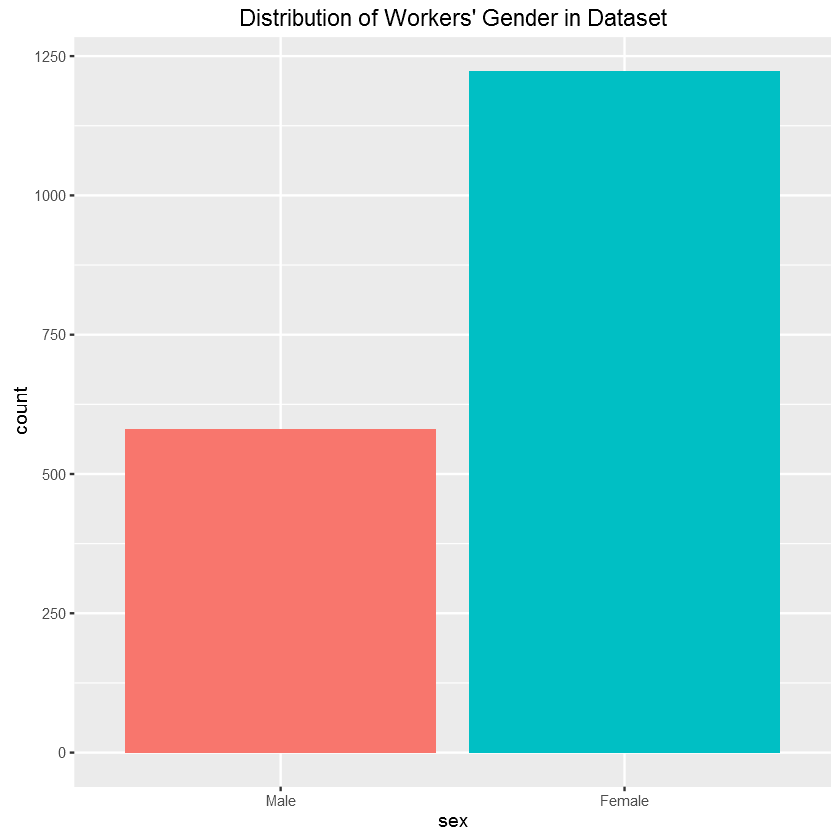

In [18]:
# Use df created before*

# Plot distribution of sex of waiters/ waitresses
gender <- ggplot(df, aes(x=sex, fill=sex)) + geom_bar()
gender + guides(fill=FALSE) + ggtitle("Distribution of Workers' Gender in Dataset")

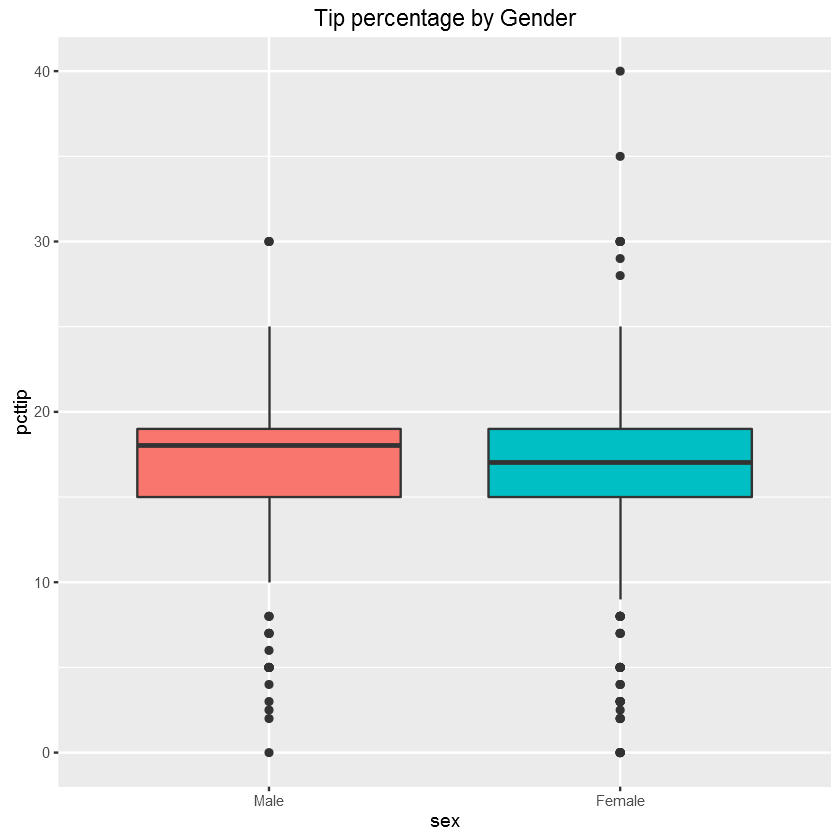

In [19]:
# Plot boxplot to show distribution of tips for each gender
gendertip <- ggplot(df, aes(sex, pcttip, fill=sex))
gendertip + geom_boxplot() + guides(fill=FALSE) + ggtitle("Tip percentage by Gender")

In [20]:
# Test if there is a significant difference between tips for genders
t.test(df$pcttip~df$sex, conf.level = 0.95)


	Welch Two Sample t-test

data:  df$pcttip by df$sex
t = 1.7689, df = 1261.4, p-value = 0.07715
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.03992855  0.77218796
sample estimates:
  mean in group Male mean in group Female 
            16.56995             16.20382 


## Distribution Warning
- Tips are somewhat right skewed centred around 10-20%

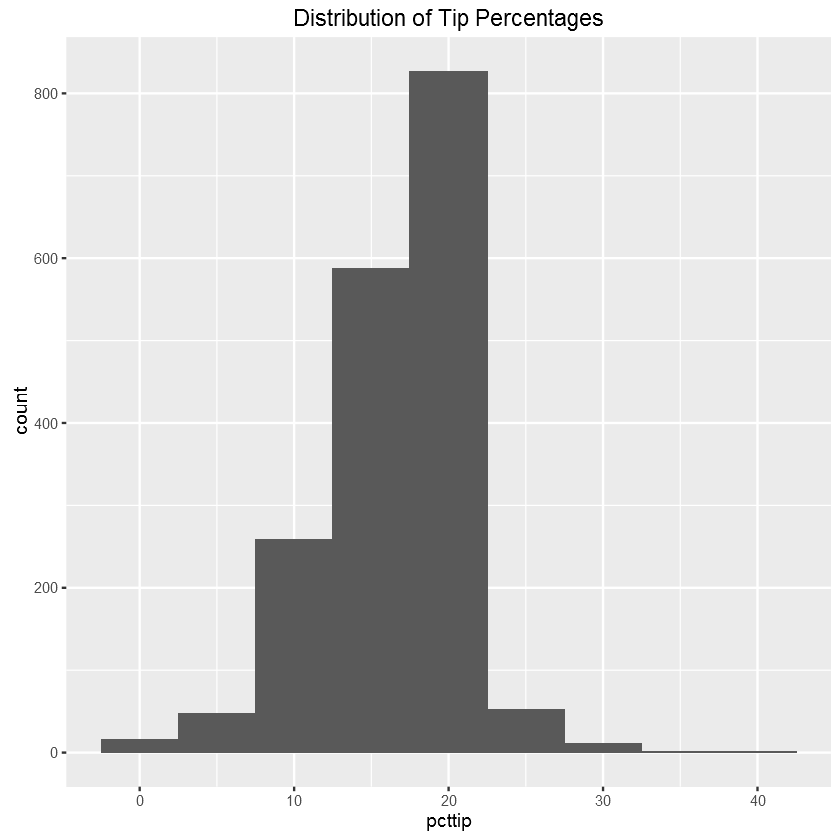

In [62]:
# Distribution of Tip Percentages
qplot(pcttip, data=df, geom="histogram", binwidth=5) + ggtitle("Distribution of Tip Percentages")

## Race of Customers

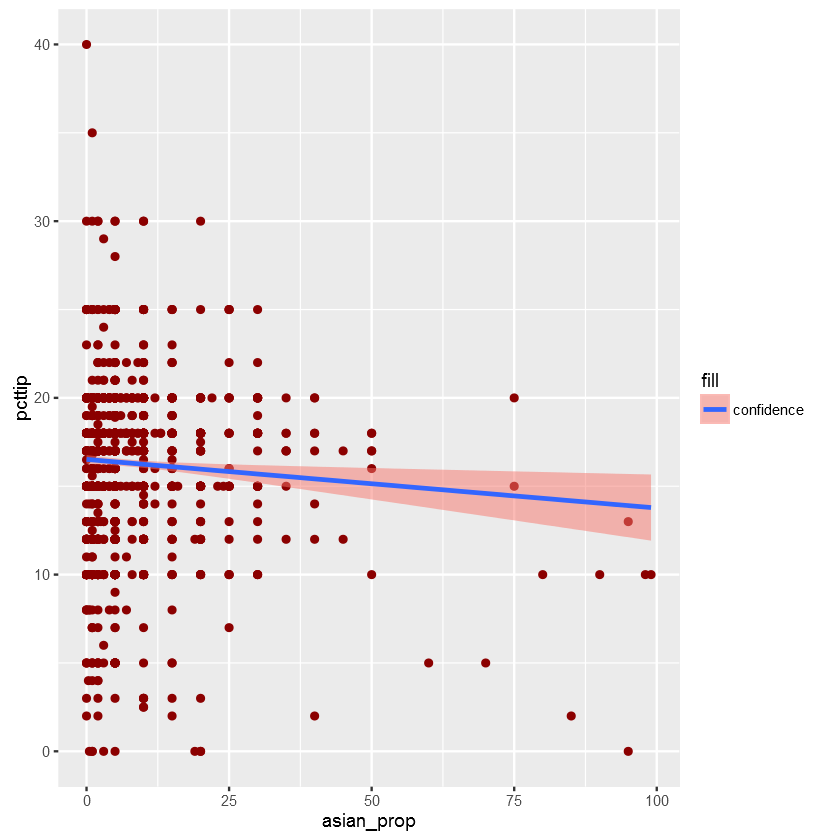

In [22]:
# Plot scatterplots of proportion of race (customers) by tip %
# Asian customers
ggplot(df, aes(x=asian_prop, y=pcttip)) +
  geom_point(colour="dark red") +
  geom_smooth(method = "lm", aes(fill = "confidence"), alpha = 0.5)

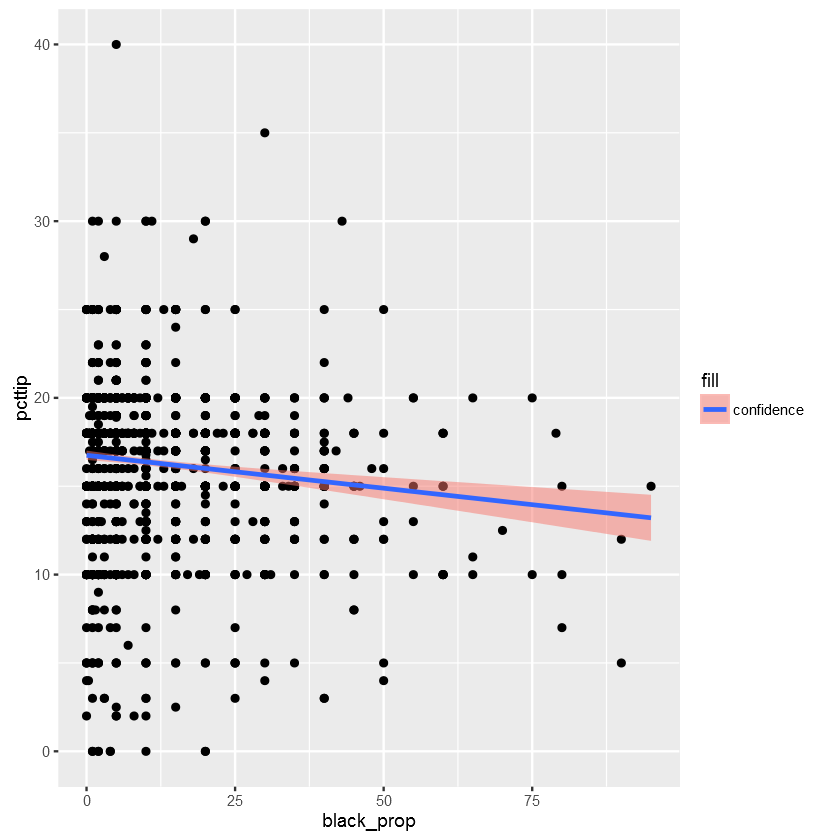

In [23]:
# Black customers
ggplot(df, aes(x=black_prop, y=pcttip)) +
  geom_point(colour="black") +
  geom_smooth(method = "lm", aes(fill = "confidence"), alpha = 0.5)

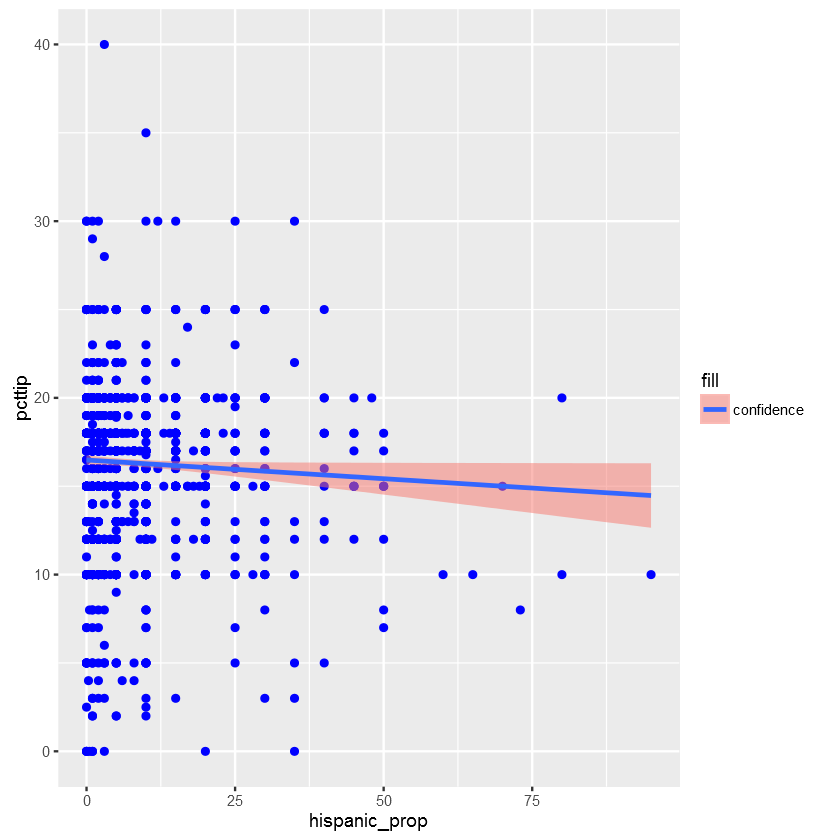

In [24]:
# Hispanic customers
ggplot(df, aes(x=hispanic_prop, y=pcttip)) +
  geom_point(colour="blue") +
  geom_smooth(method = "lm", aes(fill = "confidence"), alpha = 0.5)

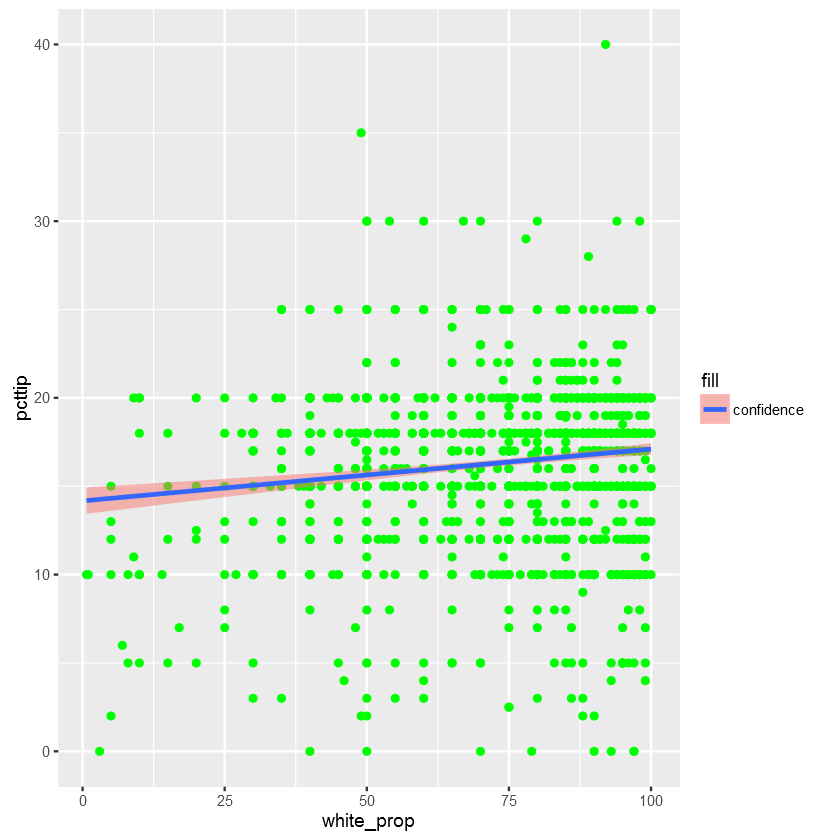

In [25]:
# White customers
ggplot(df, aes(x=white_prop, y=pcttip)) +
  geom_point(colour="green") +
  geom_smooth(method = "lm", aes(fill = "confidence"), alpha = 0.5)

## How about race of worker with race of customers?

Perhaps certain races tip higher depending on the worker?

## Dataset warning

The dataset consists of mainly workers that identified as "White"

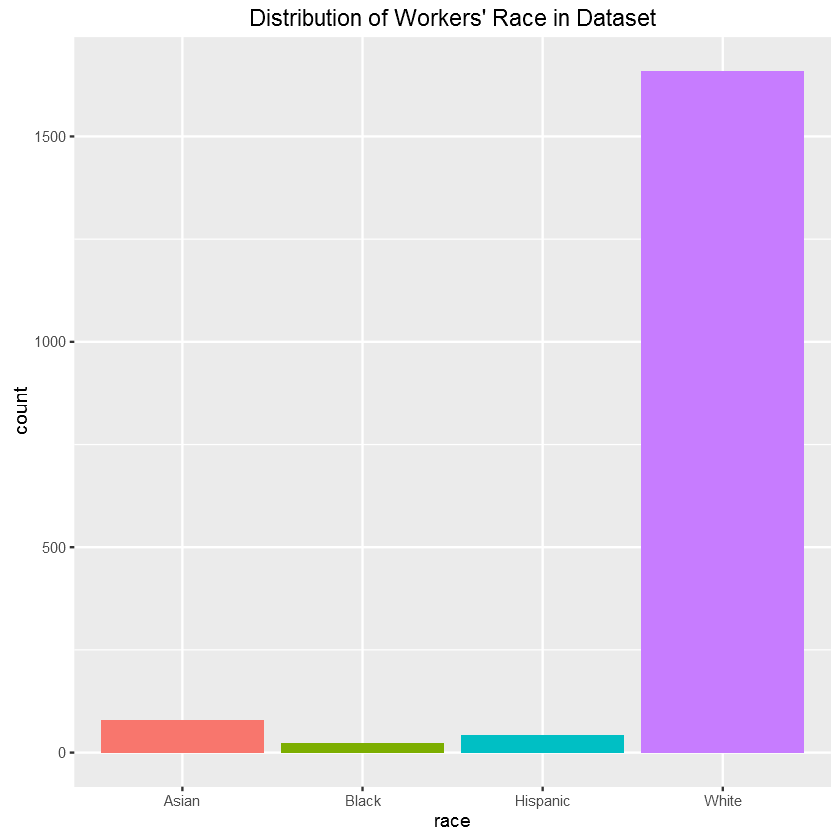

In [26]:
# Plot distribution of ethnical backgrounds of waiters/ waitresses
background <- ggplot(df, aes(x=race, fill=race)) + geom_bar()
background + guides(fill=FALSE) + ggtitle("Distribution of Workers' Race in Dataset")

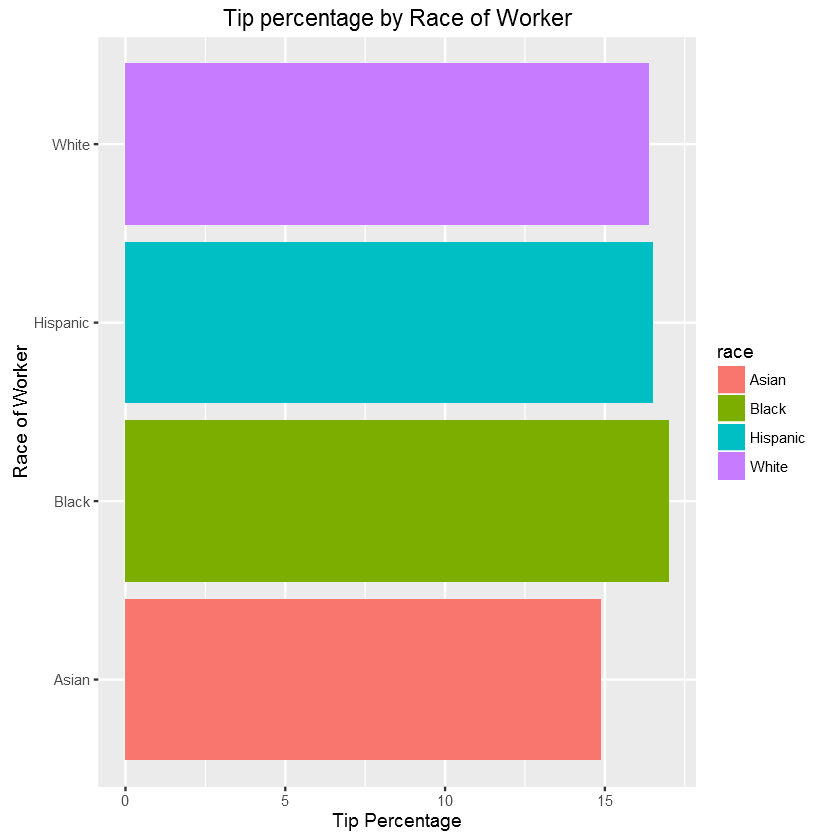

In [27]:
# Plot average tip percentage received by worker by worker race
p <- ggplot(df, aes(x=factor(race), y=pcttip, fill=race)) + stat_summary(fun.y="mean", geom="bar")
p + xlab("Race of Worker") + ylab("Tip Percentage") + 
  ggtitle("Tip percentage by Race of Worker") + coord_flip()

In [28]:
### Relationship: Customer Background VS. Server Background ###
# Asian Servers
cols <- c("pcttip", "asian_prop", "black_prop", "hispanic_prop", "white_prop")
dfasian <- subset(df, df$race == "Asian")
dfasian <- dfasian[cols]
dfasian2 = melt(dfasian, id.vars="pcttip")

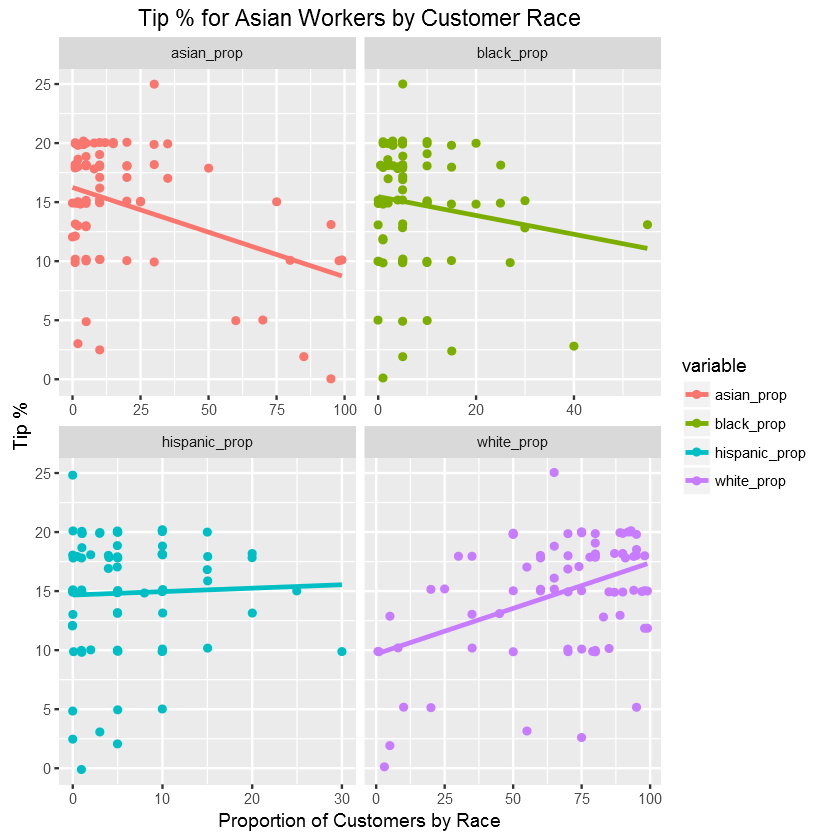

In [29]:
ggplot(dfasian2) + geom_jitter(aes(value, pcttip, colour=variable)) + 
  geom_smooth(aes(value,pcttip, colour=variable), method=lm, se=FALSE) +
  facet_wrap(~variable, scales="free_x") +
  labs(x = "Proportion of Customers by Race", y = "Tip %", 
       title = "Tip % for Asian Workers by Customer Race")

In [30]:
# Black Servers
dfblack <- subset(df, df$race == "Black")
dfblack <- dfblack[cols]
dfblack2 <- melt(dfblack, id.vars="pcttip")

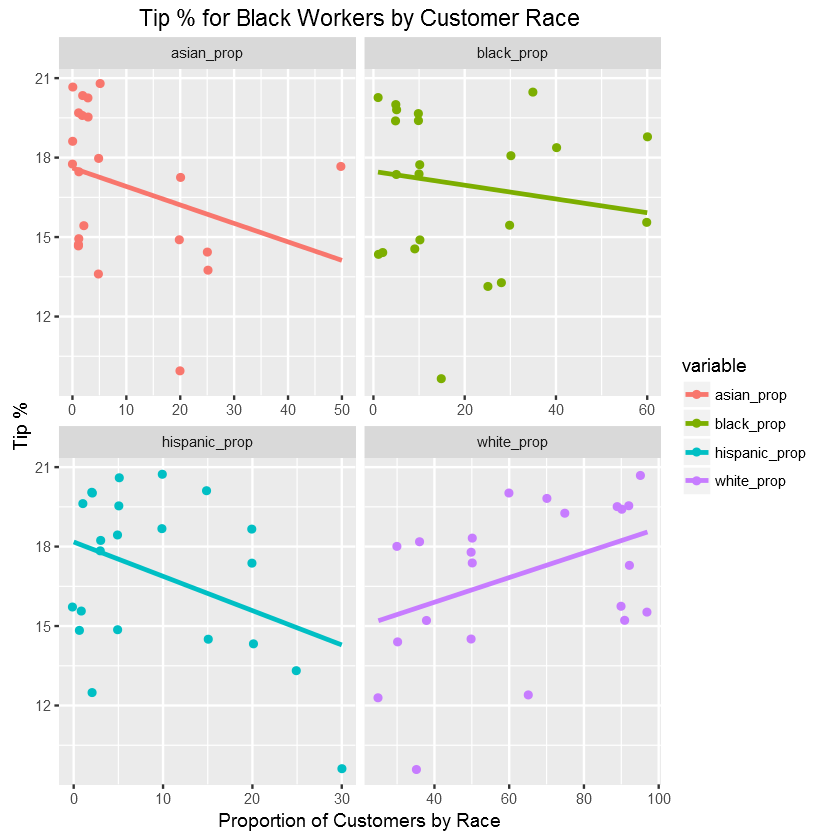

In [31]:
ggplot(dfblack2) + geom_jitter(aes(value, pcttip, colour=variable)) + 
  geom_smooth(aes(value,pcttip, colour=variable), method=lm, se=FALSE) +
  facet_wrap(~variable, scales="free_x") +
  labs(x = "Proportion of Customers by Race", y = "Tip %", 
       title = "Tip % for Black Workers by Customer Race")

In [32]:
# Hispanic Servers
dfhisp <- subset(df, df$race == "Hispanic")
dfhisp <- dfhisp[cols]
dfhisp2 <- melt(dfhisp, id.vars="pcttip")

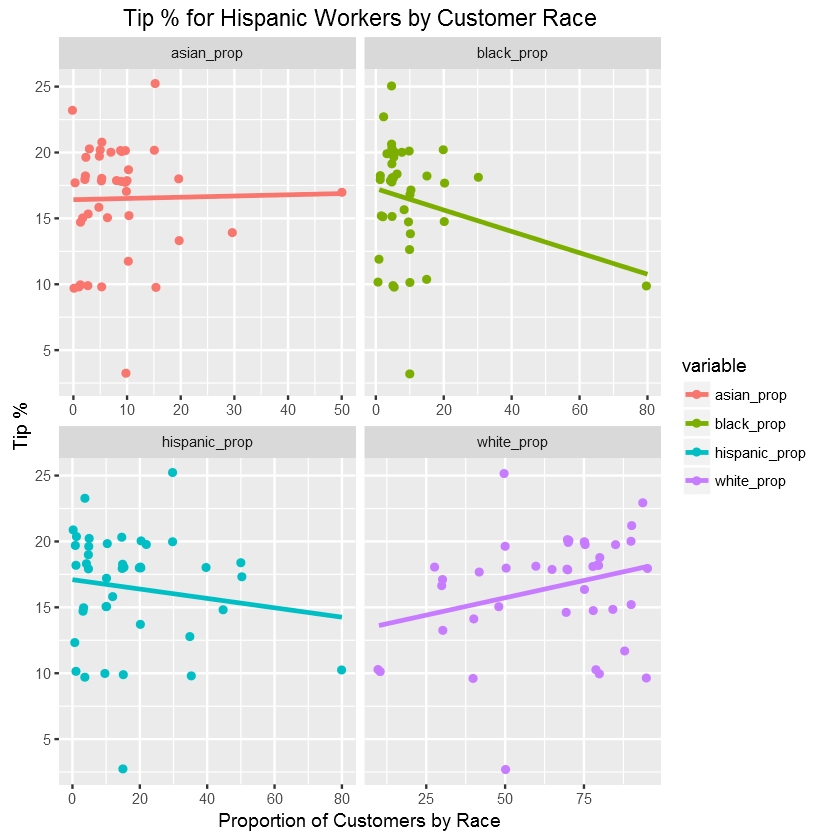

In [33]:
ggplot(dfhisp2) + geom_jitter(aes(value, pcttip, colour=variable)) + 
  geom_smooth(aes(value,pcttip, colour=variable), method=lm, se=FALSE) +
  facet_wrap(~variable, scales="free_x") +
  labs(x = "Proportion of Customers by Race", y = "Tip %", 
       title = "Tip % for Hispanic Workers by Customer Race")

In [34]:
# White Servers
dfwhite <- subset(df, df$race == "White")
dfwhite <- dfwhite[cols]
dfwhite2 <- melt(dfwhite, id.vars="pcttip")

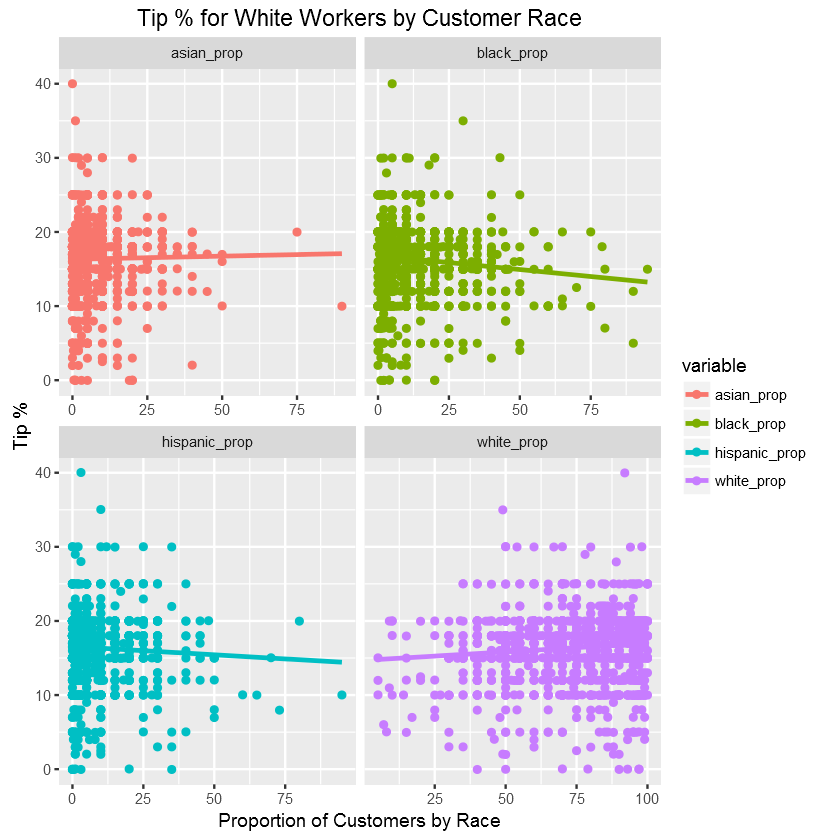

In [35]:
ggplot(dfwhite2) + geom_jitter(aes(value, pcttip, colour=variable)) + 
  geom_smooth(aes(value,pcttip, colour=variable), method=lm, se=FALSE) +
  facet_wrap(~variable, scales="free_x") +
  labs(x = "Proportion of Customers by Race", y = "Tip %", 
       title = "Tip % for White Workers by Customer Race")

## Location of Restaurant

Does location play a role in tipping? In some countries, tipping is not a social norm (as compared to US/ Canada).

### Dataset warning

A large portion of observations identified themselves as in the US

In [36]:
# Tipping habits by location
# Create vector for US state names
states <- c("al"="al","ak"="ak","az"="az","ar"="ar","ca"="ca","co"="co",
            "ct"="ct","de"="de","dc"="dc","fl"="fl","ga"="ga","hi"="hi","id"="id","il"="il","in"="in",
            "ia"="ia","ks"="ks","ky"="ky","la"="la","me"="me","md"="md","ma"="ma","mi"="mi","mn"="mn",
            "ms"="ms","mo"="mo","mt"="mt","ne"="ne","nv"="nv","nh"="nh","nj"="nj","nm"="nm","ny"="ny",
            "nc"="nc","nd"="nd","oh"="oh","ok"="ok","or"="or","pw"="pw","pa"="pa","ri"="ri","sc"="sc",
            "sd"="sd","tn"="tn","tx"="tx","ut"="ut","vt"="vt","va"="va","wa"="wa","wv"="wv","wi"="wi",
            "wy"="wy")

In [37]:
# Subset data for US workers only into a different data frame
tableUS <- subset(df, State %in% names(states), select=State:race)
tableCAD <- subset(df, State %in% "canada", select=State:race)
tableOTHER <- df[-which(df$State %in% names(states) | df$State %in% "canada"),]

In [38]:
# See how much observations there are for US workers and Canadian workers
length(tableUS$State)
length(tableCAD$State)
length(tableOTHER$State)

[1] 1632

[1] 98

[1] 72

In [39]:
# Calculate average mean tip percentage
meanUS <- mean(tableUS$pcttip, na.rm=TRUE)
meanCAD <- mean(tableCAD$pcttip, na.rm=TRUE)
meanOTHER <- mean(tableOTHER$pcttip, na.rm=TRUE)
meanWorld <- mean(df$pcttip, na.rm=TRUE)

means <- c(meanUS, meanCAD, meanOTHER, meanWorld)
names <- c("Mean USA", "Mean Canada", "Mean Other", "Mean Worldwide")
names <- factor(names, level=c("Mean USA", "Mean Canada", "Mean Other", "Mean Worldwide"))

world_means <- data.frame(names, means)

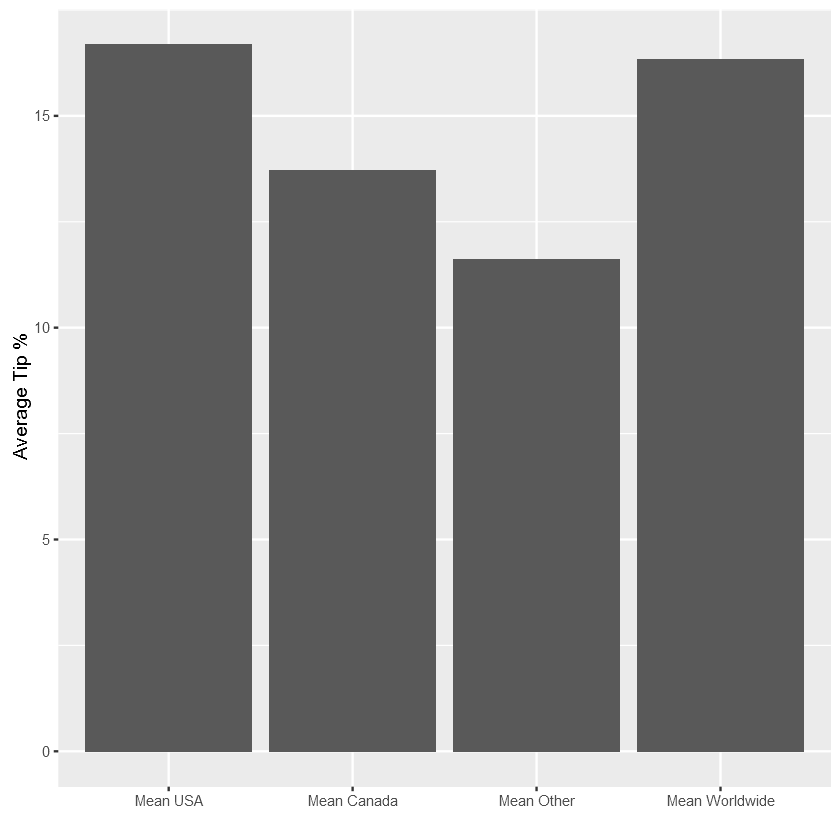

In [40]:
ggplot(data = world_means, aes(x=names, y=means)) + geom_bar(stat="identity") + 
  xlab("") + ylab("Average Tip %")

In [41]:
# Calculate mean tipping percentage by state
tip <- aggregate(pcttip~State, tableUS, mean)
tip$region <- tip$State # ensure column names match to merge later on

# Utilize the maps library to plot a map of the US
states_name <- map_data("state")

# Recode the state names received from the maps library in order to merge
states_name$region <- recode(states_name$region, 
  '"alabama"="al"; "alaska"="ak"; "arizona"="az"; "arkansas"="ar"; "california"="ca"; "colorado"="co";
  "connecticut"="ct"; "delware"="de"; "florida"="fl"; "georgia"="ga"; "hawaii"="hi"; "idaho"="id";
  "illinois"="il"; "indiana"="in"; "iowa"="ia"; "kansas"="ks"; "kentucky"="ky"; "louisiana"="la";
  "maine"="me"; "maryland"="md"; "massachusetts"="ma"; "michigan"="mi"; "minnesota"="mn"; 
  "mississippi"="mn"; "missouri"="mo"; "montana"="mt"; "nebraska"="ne"; "nevada"="nv"; 
  "new hampshire"="nh"; "new jersey"="nj"; "new mexico"="nm"; "new york"="ny"; "north carolina"="nc"; 
  "north dakota"="nd"; "ohio"="oh"; "oklahoma"="ok"; "oregon"="or"; "pennsylvania"="pa"; 
  "rhode island"="ri"; "south carolina"="sc"; "south dakota"="sc"; "tennessee"="tn"; "texas"="tx"; 
  "utah"="ut"; "vermont"="vt"; "virginia"="va"; "washington"="wa"; "west virginia"="wv"; 
  "wisconsin"="wi"; "wyoming"="wy"')

In [42]:
# Merge tables together
choro <- merge(states_name, tip, sort = FALSE, by = "region")
choro <- choro[order(choro$order), ]

Since most of the data is in the US, we can look at which states are the best tippers as well as worst tippers.

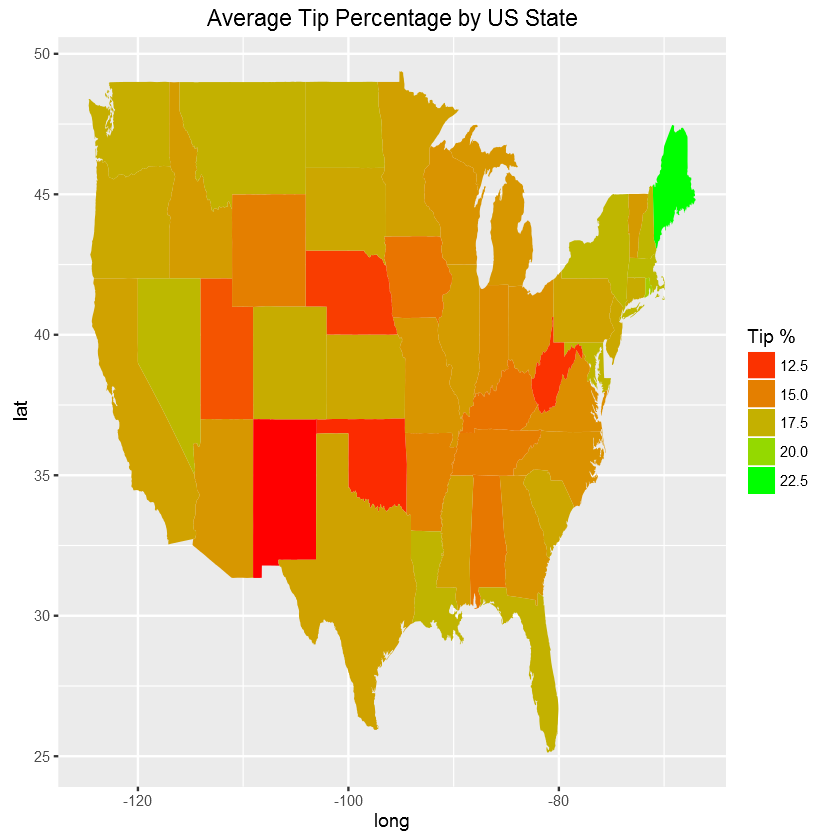

In [43]:
# Plot average tip percentage by US state
map <- ggplot(choro, aes(long, lat)) + geom_polygon(aes(group = group, fill = pcttip))
map + scale_fill_gradient(low="red", high="green") + ggtitle("Average Tip Percentage by US State") +
  guides(fill=guide_legend(title="Tip %"))

In [44]:
# View top 3 states
tip2 <- tip[with(tip, order(-pcttip)),] # sort descending by tip %
head(tip2, 3)

# View bottom 3 states
tail(tip2, 3)

,State,pcttip,region
22,me,22.5,me
40,ri,19.2,ri
20,ma,18.0285714285714,ma


,State,pcttip,region
33,nm,12,nm
26,ms,10,ms
42,sd,10,sd


The top states are:

Maine (22.50%)
Rhode Island (19.20%)
Massachusetts (18.03%)

The lowest states are:

New Mexico (12.00%)
South Dakota (10.00%)
Mississippi (10.00%)

## Bill Sizes

What effect do size of the bill have on gratuity?

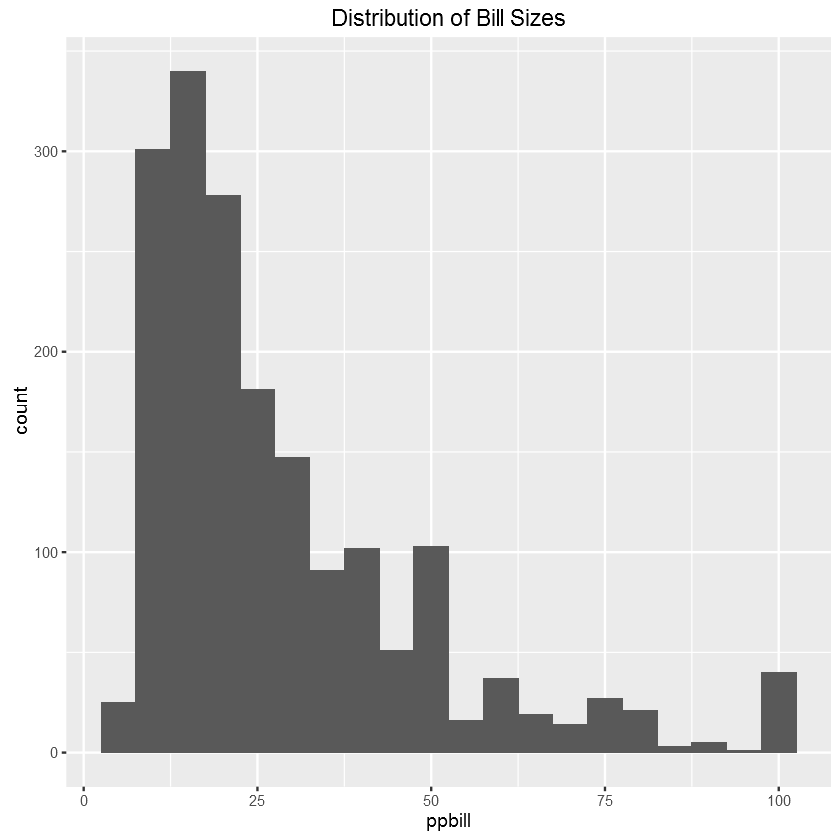

In [45]:
# Distribution of Bill Sizes
qplot(ppbill, data=df, geom="histogram", binwidth=5) + ggtitle("Distribution of Bill Sizes")

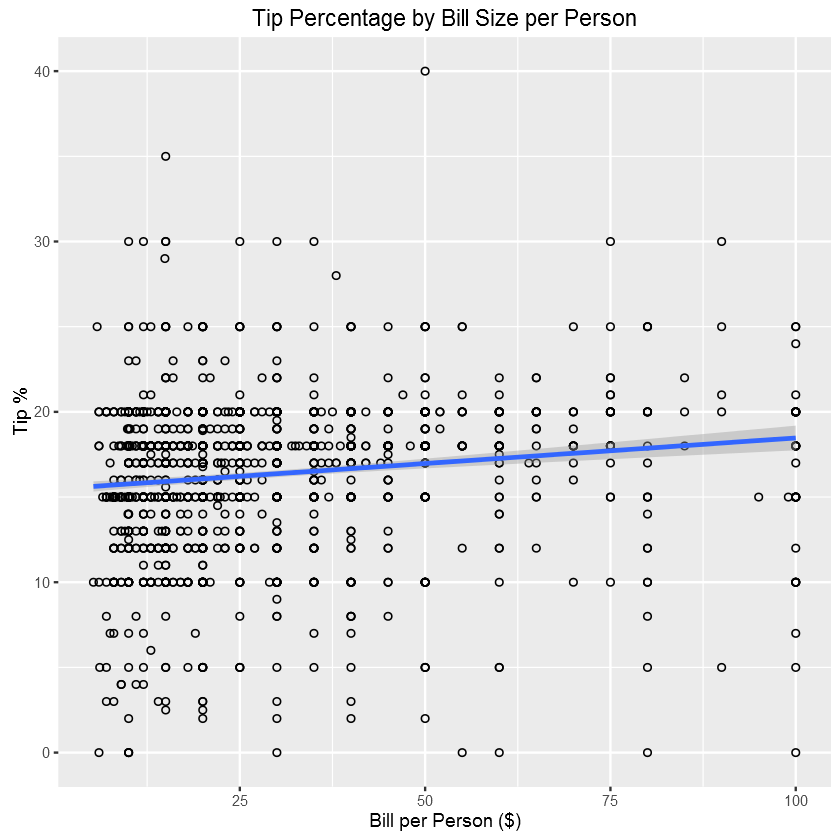

In [46]:
# Plot bill size against tip percentage
ggplot(df, aes(x=ppbill, y=pcttip)) + geom_point(shape=1) + geom_smooth(method=lm) +
  xlab("Bill per Person ($)") + ylab("Tip %") + ggtitle("Tip Percentage by Bill Size per Person")

# Customer Interactions

Waiters/ Waitresses are constantly interacting with their customers.

Can we identify specific ways to interact that lead to better tips?

In [47]:
# Customer Interactions
# See http://www.r-bloggers.com/grouped-means-again/
a <- aggregate(df$pcttip, by=list(Rating=df$flair), mean)
a1 <- aggregate(df$pcttip, by=list(Rating=df$intro), mean)
a2 <- aggregate(df$pcttip, by=list(Rating=df$selling), mean)
a3 <- aggregate(df$pcttip, by=list(Rating=df$repeat.), mean)
a4 <- aggregate(df$pcttip, by=list(Rating=df$customer_name), mean)
a5 <- aggregate(df$pcttip, by=list(Rating=df$smile), mean)
a6 <- aggregate(df$pcttip, by=list(Rating=df$thanks), mean)

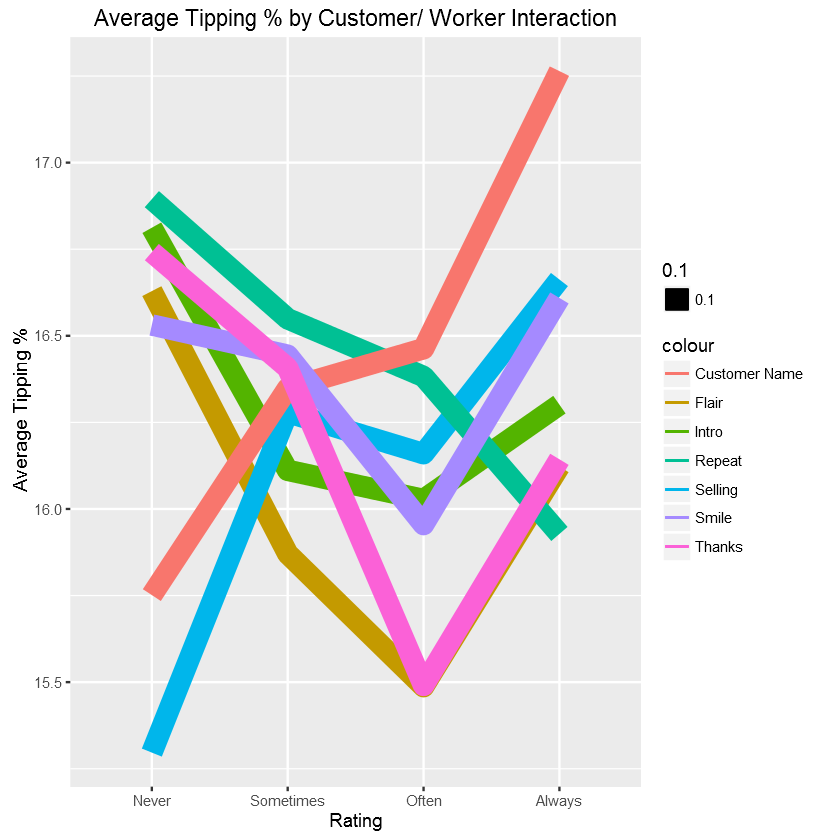

In [48]:
ggplot(data=a, aes(x=Rating, y=x, group=1, size=0.1)) + geom_line(aes(colour="Flair"))  +
  geom_line(aes(y=a1$x, colour="Intro")) +
  geom_line(aes(y=a2$x, colour="Selling")) +
  geom_line(aes(y=a3$x, colour="Repeat")) +
  geom_line(aes(y=a4$x, colour="Customer Name")) +
  geom_line(aes(y=a5$x, colour="Smile")) +
  geom_line(aes(y=a6$x, colour="Thanks")) +
  ylab("Average Tipping %") + ggtitle("Average Tipping % by Customer/ Worker Interaction")

## Inherent Traits of Workers

Customer service is the most important objective for restaurant workers. Can these workers change their inherent traits to maximize tips?

In [49]:
# Server Traits
b <- aggregate(df$pcttip, by=list(Rating=df$Extraverted_enthusiastic), mean)
b1 <- aggregate(df$pcttip, by=list(Rating=df$Critical_quarrelsome), mean)
b2 <- aggregate(df$pcttip, by=list(Rating=df$Dependable_selfdisciplined), mean)
b3 <- aggregate(df$pcttip, by=list(Rating=df$Anxious_easily_upset), mean)
b4 <- aggregate(df$pcttip, by=list(Rating=df$Reserved_quiet), mean)
b5 <- aggregate(df$pcttip, by=list(Rating=df$Sympathetic_warm), mean)
b6 <- aggregate(df$pcttip, by=list(Rating=df$Disorganized_careless), mean)
b7 <- aggregate(df$pcttip, by=list(Rating=df$Conventional_uncreative), mean)

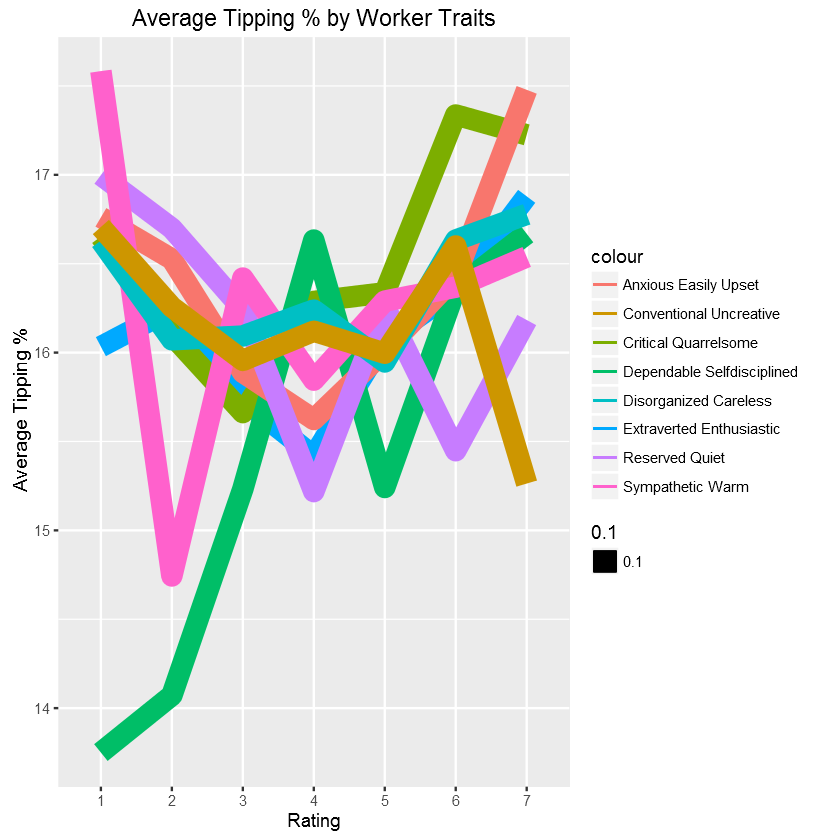

In [50]:
ggplot(data=b, aes(x=Rating, y=x, group=1, size=0.1)) + 
  geom_line(aes(colour="Extraverted Enthusiastic")) +
  geom_line(aes(y=b1$x, colour="Critical Quarrelsome")) +
  geom_line(aes(y=b2$x, colour="Dependable Selfdisciplined")) +
  geom_line(aes(y=b3$x, colour="Anxious Easily Upset")) +
  geom_line(aes(y=b4$x, colour="Reserved Quiet")) +
  geom_line(aes(y=b5$x, colour="Sympathetic Warm")) +
  geom_line(aes(y=b6$x, colour="Disorganized Careless")) +
  geom_line(aes(y=b7$x, colour="Conventional Uncreative")) +
  ylab("Average Tipping %") + ggtitle("Average Tipping % by Worker Traits")

## Age and Gender of Worker

Are young females more likely to be tipped than older males?

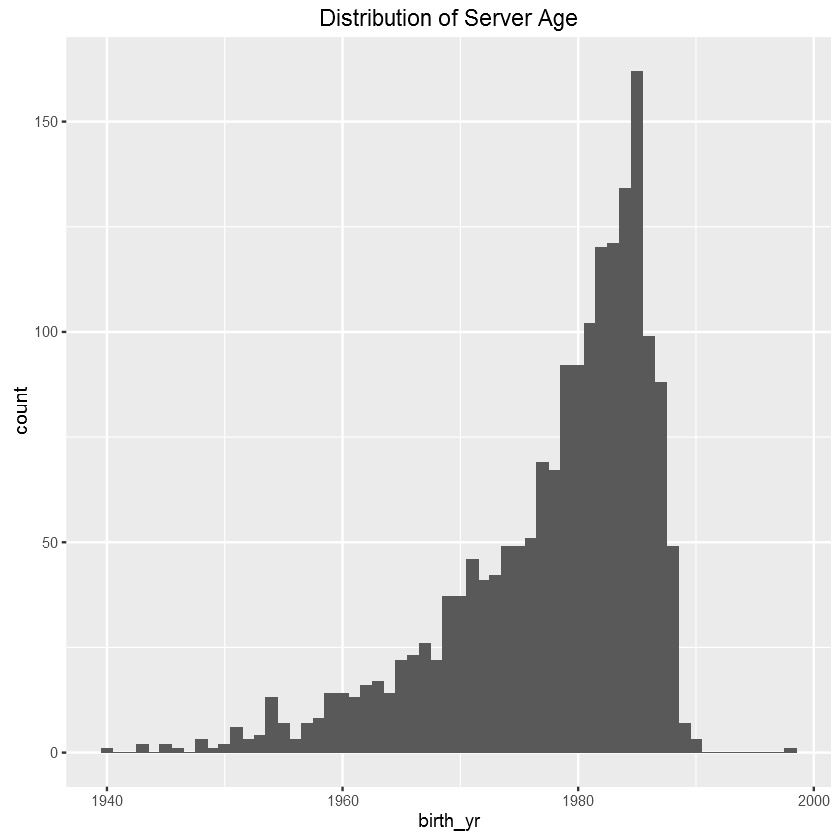

In [51]:
# Distribution of Server Age
qplot(birth_yr, data=df, geom="histogram", binwidth=1) + ggtitle("Distribution of Server Age")

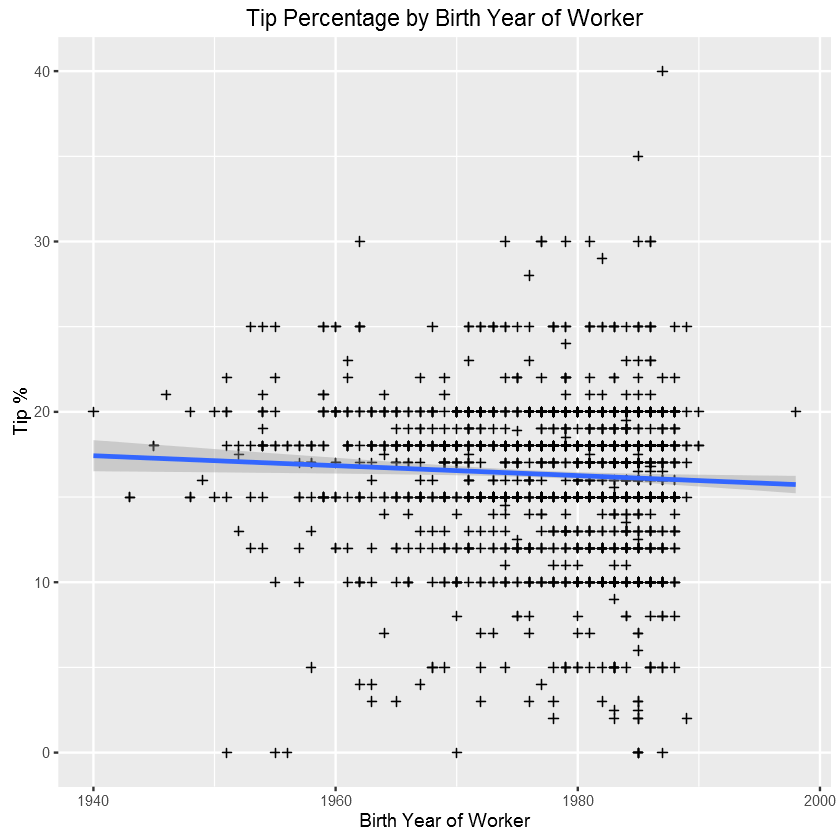

In [52]:
# Server Age
ggplot(df, aes(x=birth_yr, y=pcttip)) + geom_point(shape=3) + geom_smooth(method=lm) +
  xlab("Birth Year of Worker") + ylab("Tip %") + ggtitle("Tip Percentage by Birth Year of Worker")

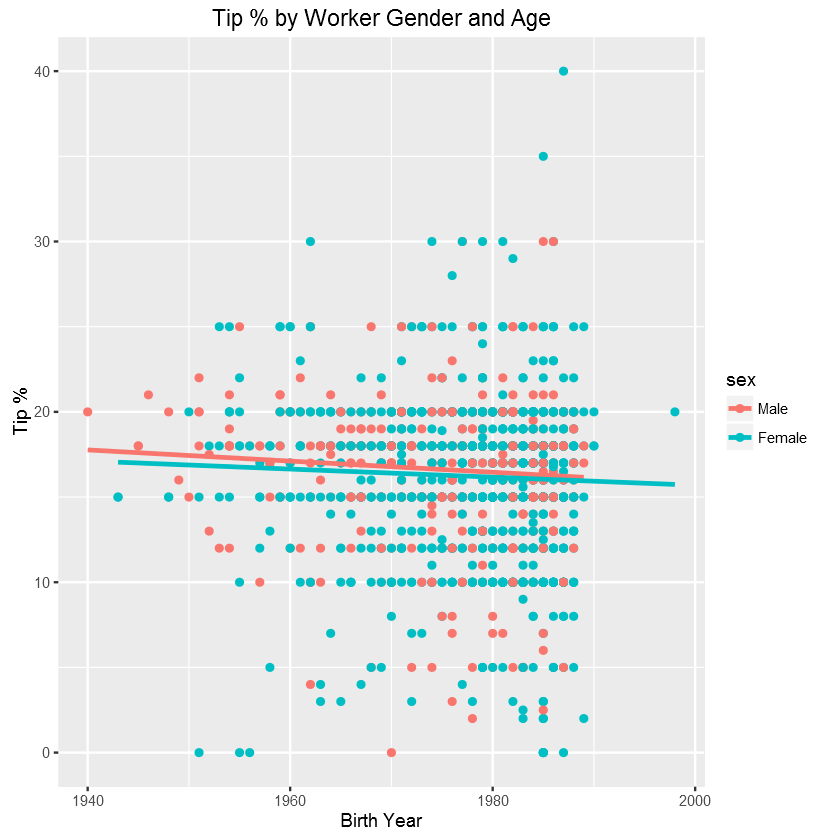

In [53]:
# Server Age vs Server Gender
ggplot(df, aes(x=birth_yr, y=pcttip, colour = sex)) + geom_point() + 
  geom_smooth(method="lm", se=FALSE) +
  xlab("Birth Year") + ylab("Tip %") + ggtitle("Tip % by Worker Gender and Age")

## Customer Interaction with Different Genders

Do males have an advantage over females over certain interaction methods?

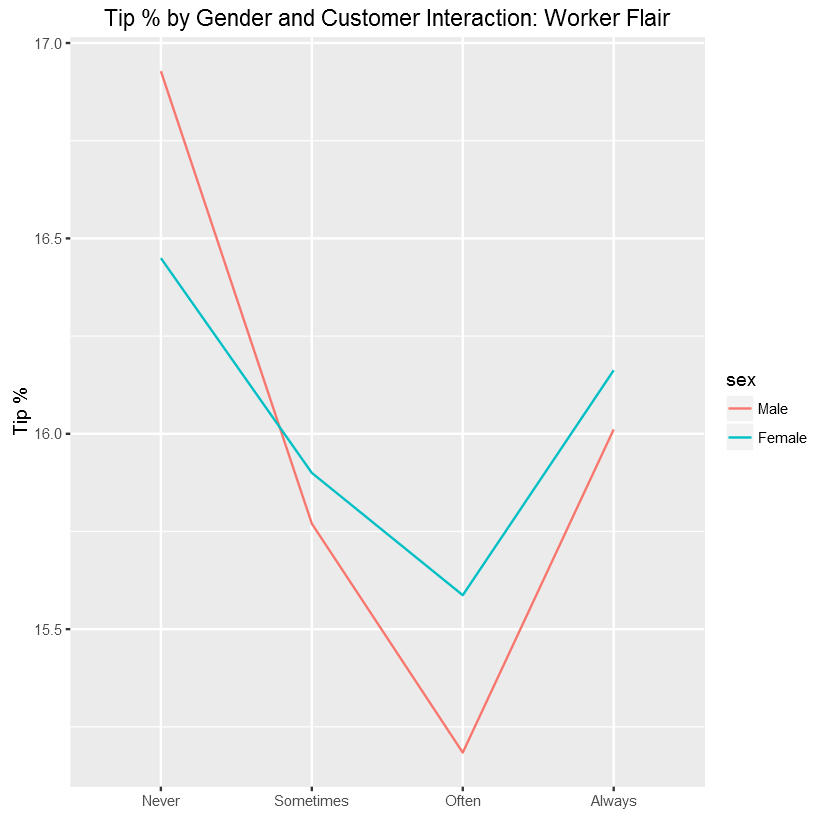

In [54]:
# Customer Interaction vs. Gender
# Flair
ggplot(data=df, aes(x=flair, y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") + 
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Worker Flair")

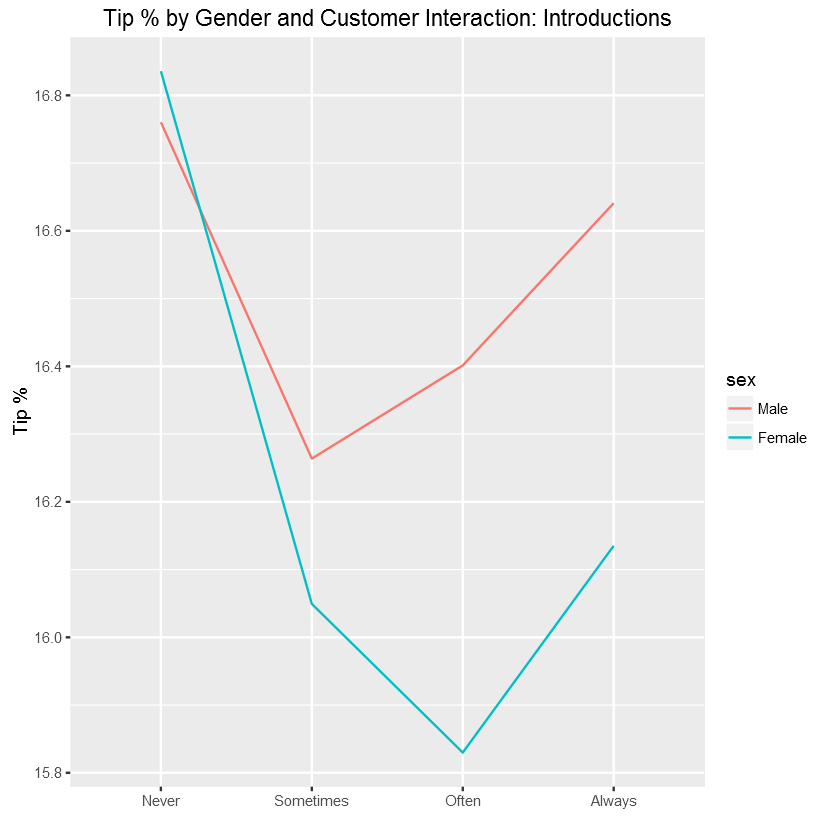

In [55]:
# Intro
ggplot(data=df, aes(x=intro, y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") + 
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Introductions")

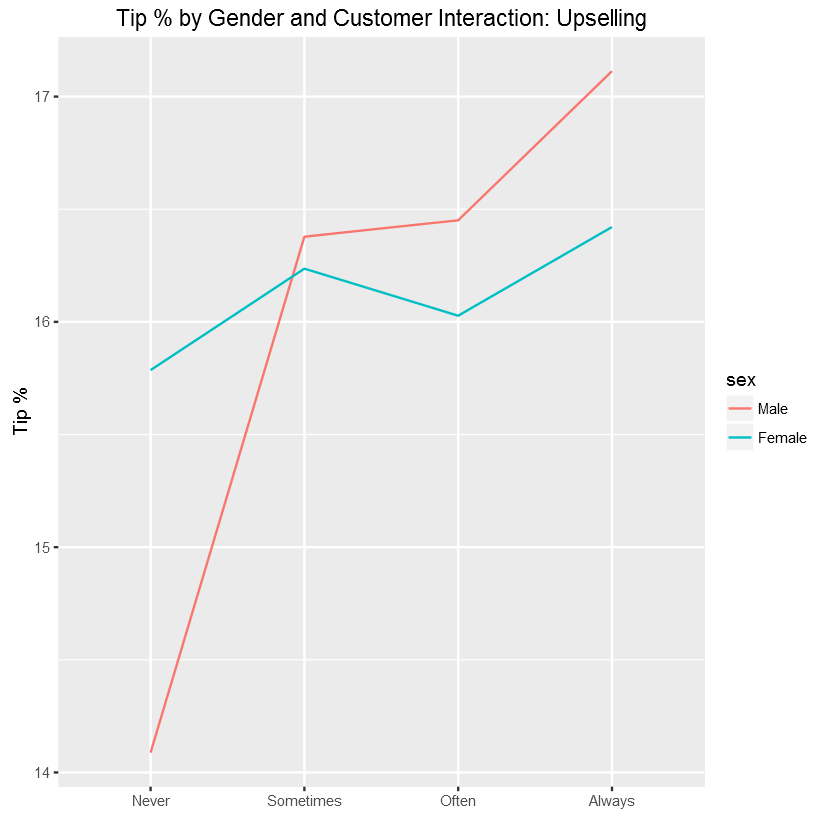

In [56]:
# Upselling
ggplot(data=df, aes(x=selling, y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") + 
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Upselling")

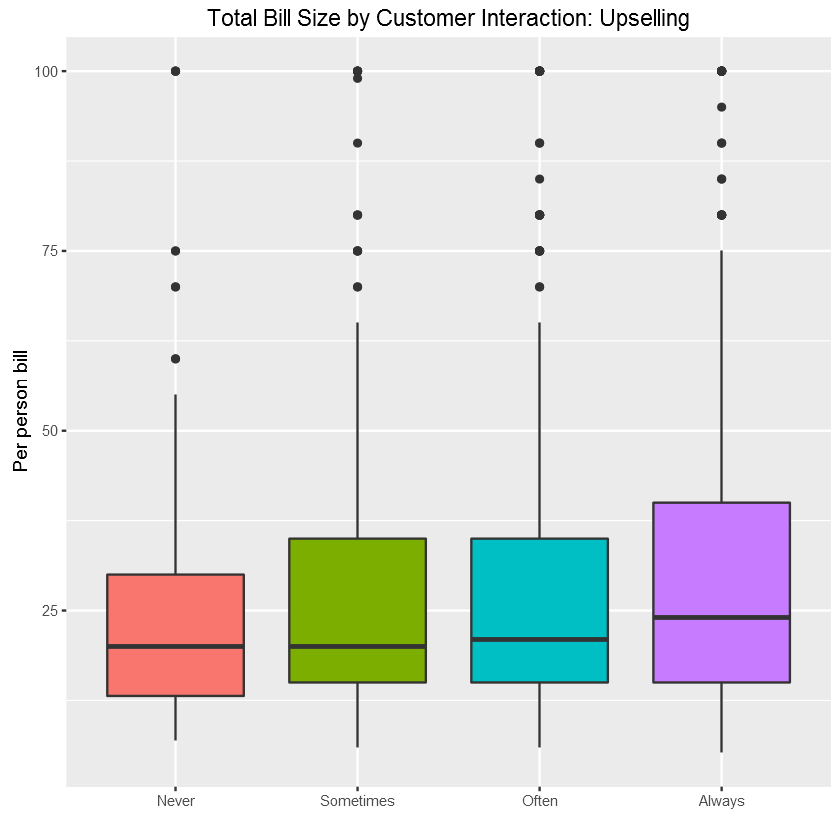

In [57]:
# See relationship between upselling and per person bill
ggplot(data=df, aes(x=selling, y=ppbill, fill=selling)) + geom_boxplot() + guides(fill=FALSE) +
  xlab("") + ylab("Per person bill") + ggtitle("Total Bill Size by Customer Interaction: Upselling")

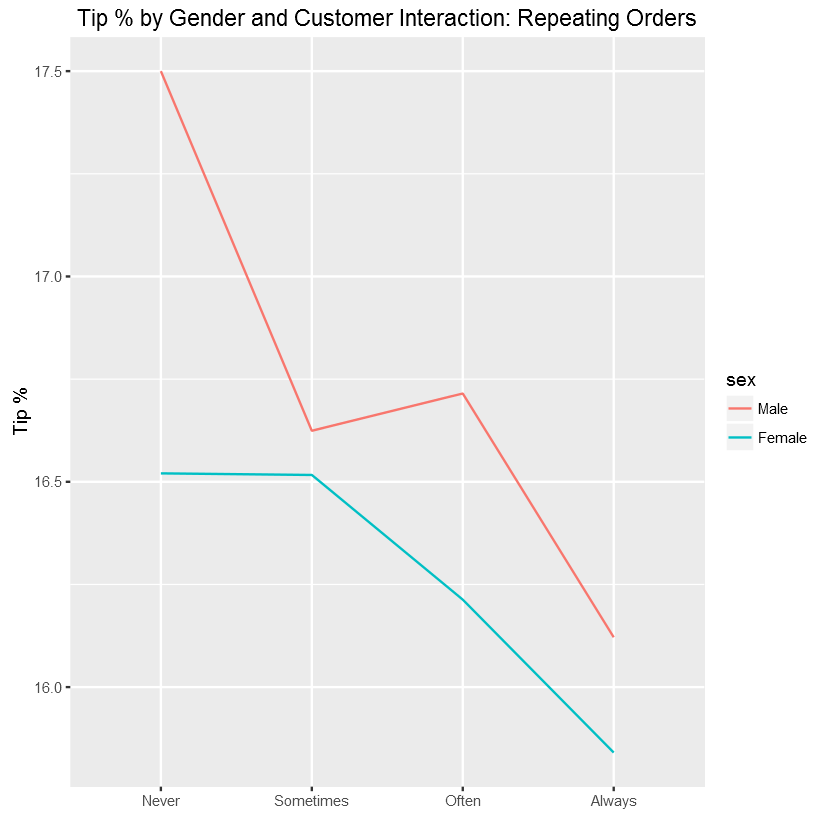

In [58]:
# Repeat order  
ggplot(data=df, aes(x=repeat., y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") +
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Repeating Orders")

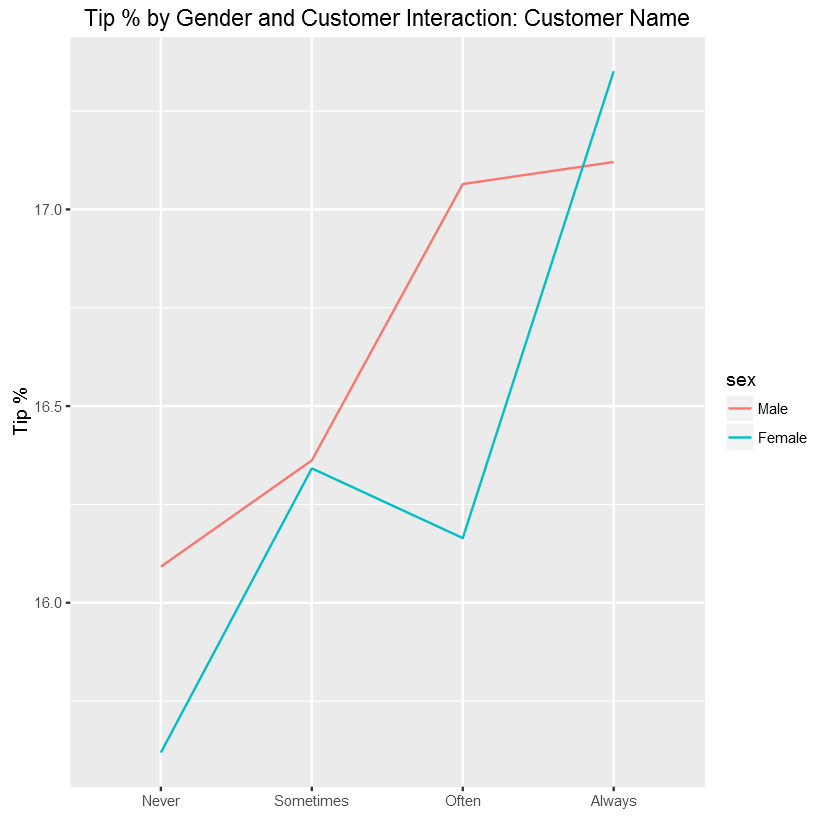

In [59]:
# Customer Name
ggplot(data=df, aes(x=customer_name, y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") + 
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Customer Name")

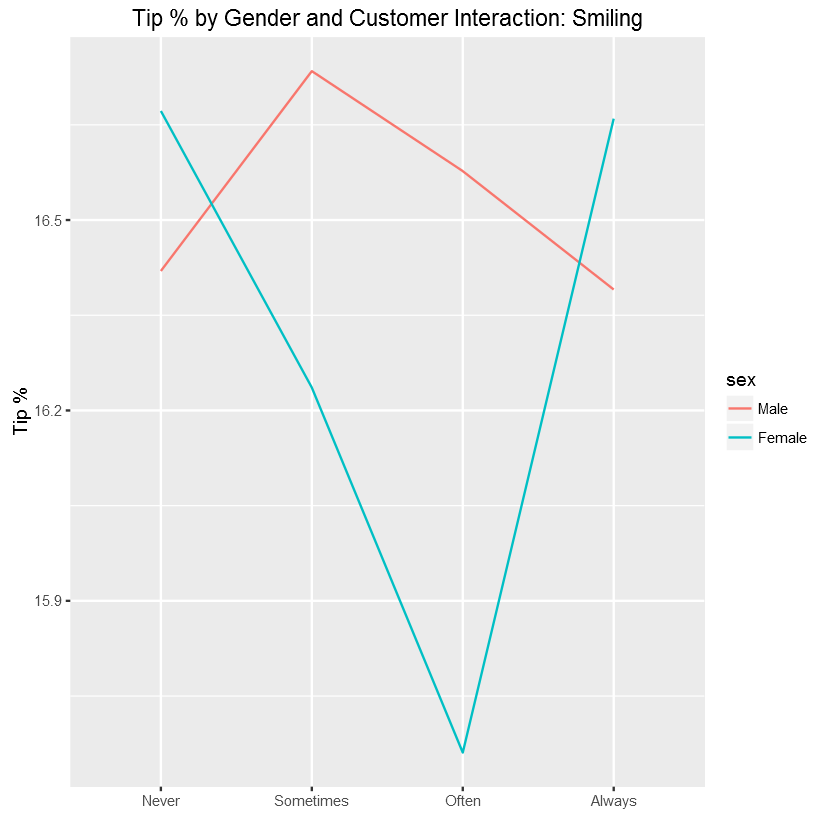

In [60]:
# Smile
ggplot(data=df, aes(x=smile, y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") + 
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Smiling")

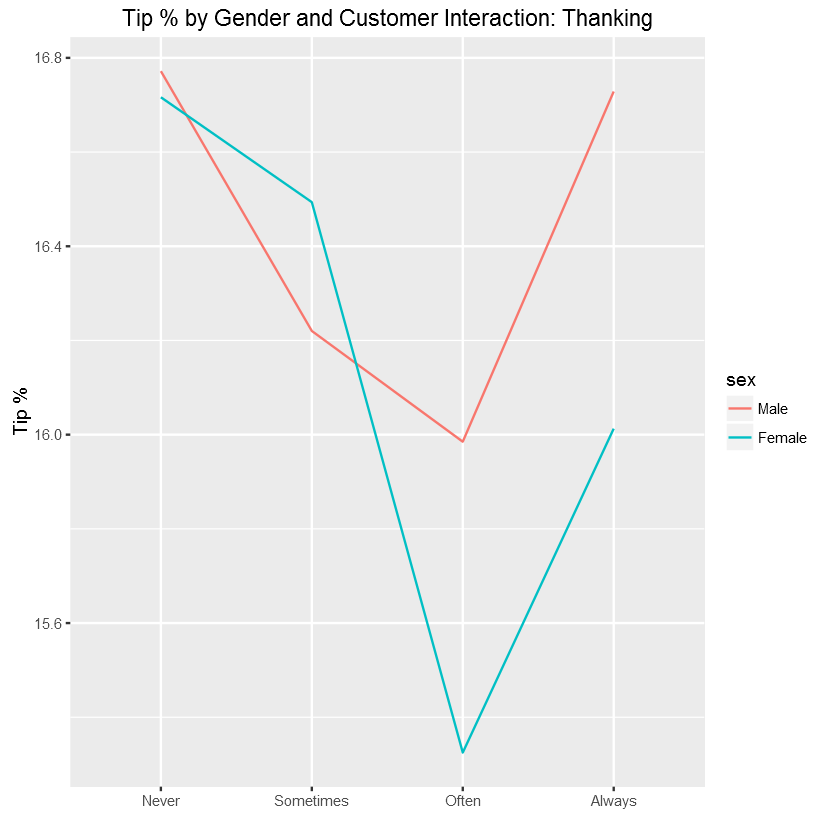

In [61]:
# Thanking
ggplot(data=df, aes(x=thanks, y=pcttip, group=sex, colour=sex)) + 
  stat_summary(fun.y="mean", geom="line") + 
  xlab("") + ylab("Tip %") + ggtitle("Tip % by Gender and Customer Interaction: Thanking")

# Strange results?

- The results of both customer interaction and worker traits have been strange.
- Did survey takers confuse 1 and 4 (i.e. "Never" and "Always")?
- **Response bias** could be the answer to these unconventional results: many workers often chose the 'neutral' responses in the middle
    - In addition, it is very difficult for a worker to describe themselves (i.e. identify their inherent traits with the most accuracy)
    - They may see themselves in a different light as compared to what others see





# Method 2: Regression Model Analysis

We will attempt to build a multiple regression model to compare with our visualization results.

In [64]:
rm(list = ls()) # remove work environment to start fresh

#setwd("C:/Users/Kevin.Nguyen/Dropbox/CKME136")
setwd("C:/Users/Kevin/Desktop/Dropbox/Dropbox/CKME136")
df <- read.csv(file="clean_string_data.csv", head=TRUE)

# Categorize the State variable
states <- c("al","ak","az","ar","ca","co",
            "ct","de","dc","fl","ga","hi","id","il","in",
            "ia","ks","ky","la","me","md","ma","mi","mn",
            "ms","mo","mt","ne","nv","nh","nj","nm","ny",
            "nc","nd","oh","ok","or","pw","pa","ri","sc",
            "sd","tn","tx","ut","vt","va","wa","wv","wi",
            "wy")

In [65]:
# USA = 1, Canada = 2, Other = 3
df$State <- ifelse(df$State %in% states, 1,
                   ifelse(df$State %in% "canada", 2, 3))

df$State <- factor(df$State, levels=c(1,2,3))

In [66]:
# Change data type from order back to default as the ratings are not categorical
dfrating <- df[9:15]
for (col in names(dfrating)) {
  df[[col]] <- ifelse(df[[col]] == "Never", 1,
                      ifelse(df[[col]] == "Sometimes", 2,
                             ifelse(df[[col]] == "Often", 3, 4)))
}

# Sex
df$sex <- factor(df$sex, levels=c("Male", "Female"), labels=c(0,1))

# Race of Worker
df$race <- factor(df$race, levels=c("Asian", "Black", "Hispanic", "White"), labels=c(1,2,3,4))

In [67]:
# Create formula
formula_text <- paste(names(df)[8], "~",
                      paste(names(df[c(2:7,9:26)]), collapse="+"))
formula <- as.formula(formula_text)
formula

pcttip ~ State + asian_prop + black_prop + hispanic_prop + white_prop + 
    ppbill + flair + intro + selling + repeat. + customer_name + 
    smile + thanks + Extraverted_enthusiastic + Critical_quarrelsome + 
    Dependable_selfdisciplined + Anxious_easily_upset + Reserved_quiet + 
    Sympathetic_warm + Disorganized_careless + Conventional_uncreative + 
    birth_yr + sex + race

In [68]:
# Create Multiple Regression Linear Example
set.seed(12)
fit <- lm(formula, data=df)
summary(fit)


Call:
lm(formula = formula, data = df)

Residuals:
     Min       1Q   Median       3Q      Max 
-19.0610  -1.8060   0.3446   2.1508  21.3574 

Coefficients:
                             Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 9.9213405 23.8911133   0.415  0.67799    
State2                     -3.4885345  0.4263435  -8.182 5.25e-16 ***
State3                     -5.4596437  0.4945634 -11.039  < 2e-16 ***
asian_prop                  0.0585557  0.0276573   2.117  0.03438 *  
black_prop                  0.0223133  0.0263146   0.848  0.39658    
hispanic_prop               0.0358644  0.0270221   1.327  0.18460    
white_prop                  0.0558711  0.0255800   2.184  0.02908 *  
ppbill                      0.0303990  0.0049349   6.160 8.98e-10 ***
flair                      -0.2429342  0.1003019  -2.422  0.01553 *  
intro                      -0.1466406  0.0924659  -1.586  0.11294    
selling                     0.2728751  0.1116739   2.443  0.01464 *  
r

Our R^2 result was very poor at 0.1616!

However, since the dataset consisted of entirely of responses by humans (refer to psych studies and how low R^2 responses are normal)

Let attempt to build a better model by viewing any influential points (outliers) and multicollinearity.

In [69]:
# Check multicollinearity
vif(fit)

,GVIF,Df,GVIF^(1/(2*Df))
State,1.161228,2.000000,1.038077
asian_prop,8.382342,1.000000,2.895227
black_prop,12.956576,1.000000,3.599524
hispanic_prop,7.615791,1.000000,2.759672
white_prop,29.67428,1.00000,5.44741
ppbill,1.135418,1.000000,1.065560
flair,1.104419,1.000000,1.050913
intro,1.371658,1.000000,1.171178
selling,1.256237,1.000000,1.120820
repeat.,1.112821,1.000000,1.054903


In [70]:
# Outliers
outlierTest(fit)

      rstudent unadjusted p-value Bonferonni p
53    5.479471         4.8776e-08   8.7894e-05
214   5.139982         3.0511e-07   5.4980e-04
545  -4.939718         8.5596e-07   1.5424e-03
1472 -4.584520         4.8685e-06   8.7730e-03
72    4.550650         5.7112e-06   1.0292e-02

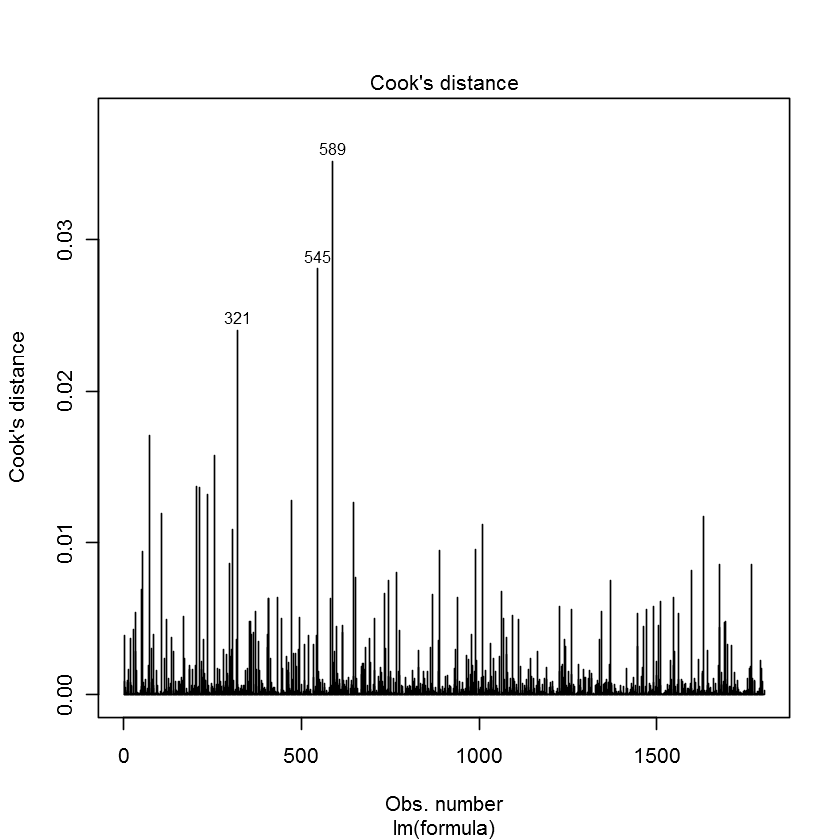

In [71]:
# Influential Observations
# Cook's D plot
cutoff <- 4/((nrow(df)-length(fit$coefficients)-2))
plot(fit, which=4, cook.levels=cutoff)

,StudRes,Hat,CookD
53,5.47947150,0.00885627,0.00942726
589,-1.62388675,0.27199896,0.03515508


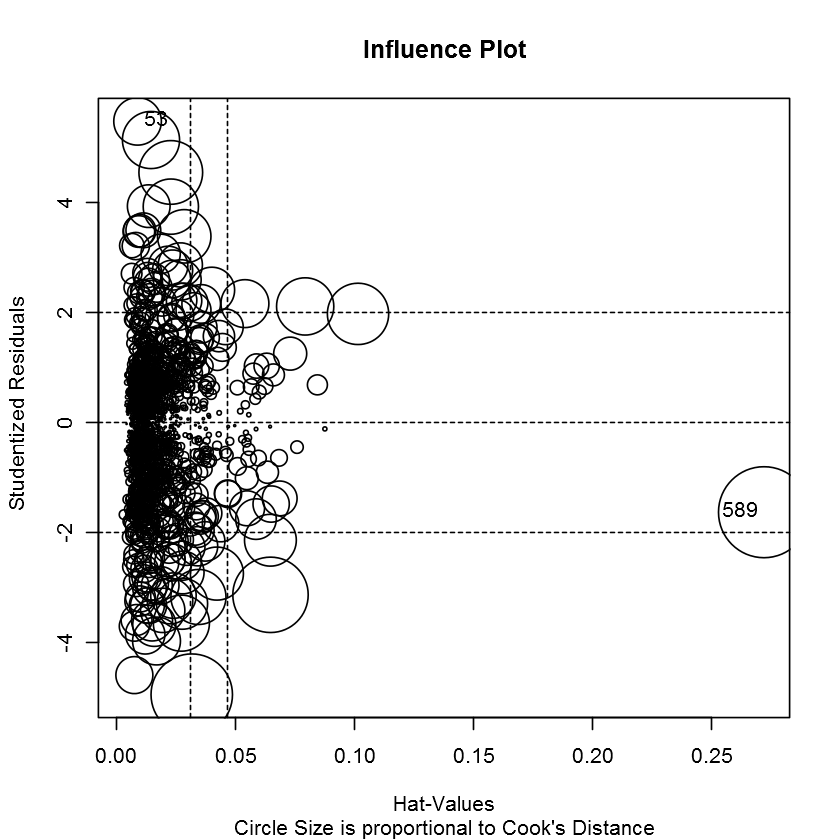

In [72]:
# Influence plot
influencePlot(fit, id.method="noteworthy", main="Influence Plot", 
              sub="Circle Size is proportional to Cook's Distance")

In [73]:
# Lets check the influential observations and decide to remove them or not
# The following are mentioned: 53, 72, 214, 321, 545, 589, 1472

df[53,] # large bill with very large tip
df[72,] # above average tip
df[214,] # proportions don't add up properly, large tip - [DELETE]
df[321,] # large Asian proportion, large bill with NO tip, worker has asian background
df[545,] # proportions don't add up properly, extremely large bill with no tip - [DELETE]
df[589,] # proportions don't make sense - [DELETE]
df[1472,] # No tip and very old worker age

,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
53,69,1,0,5,3,92,50,40,1,4,...,5,7,1,2,6,1,1,1987,1,4


,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
72,91,3,3,18,1,78,14.89,29,1,4,...,1,7,1,1,7,2,1,1982,1,4


,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
214,274,1,1,30,10,49,15,35,1,4,...,2,4,2,1,6,1,3,1985,1,4


,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
321,418,3,95,1,1,3,55,0,2,2,...,6,6,6,5,6,5,3,1985,1,1


,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
545,720,1,19,4,35,50,100,0,1,4,...,2,5,1,3,7,2,7,1955,1,4


,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
589,778,1,3,7,3,7,13,6,1,3,...,3,6,1,4,3,6,4,1985,0,4


,X,State,asian_prop,black_prop,hispanic_prop,white_prop,ppbill,pcttip,flair,intro,...,Critical_quarrelsome,Dependable_selfdisciplined,Anxious_easily_upset,Reserved_quiet,Sympathetic_warm,Disorganized_careless,Conventional_uncreative,birth_yr,sex,race
1472,2030,1,1,1,1,97,30,0,2,3,...,3,7,3,3,7,3,2,1956,1,4


In [74]:
# Delete observations: 214, 545, 589
df <- df[-c(214,545,589),]

In [75]:
# Our VIF check resulted in the 4 proportions having multicollinearity issues
# Lets remove these 4 variables from our analysis
props <- c("asian_prop", "black_prop", "hispanic_prop", "white_prop")
for (col in props) {
  df[[col]] <- NULL
}

In [76]:
# Rerun tests?
set.seed(12)
formula_text <- paste(names(df)[4], "~",
                      paste(names(df[c(2:3,5:22)]), collapse="+"))
formula <- as.formula(formula_text)
formula

pcttip ~ State + ppbill + flair + intro + selling + repeat. + 
    customer_name + smile + thanks + Extraverted_enthusiastic + 
    Critical_quarrelsome + Dependable_selfdisciplined + Anxious_easily_upset + 
    Reserved_quiet + Sympathetic_warm + Disorganized_careless + 
    Conventional_uncreative + birth_yr + sex + race

In [77]:
fit <- lm(formula, data=df)
summary(fit)


Call:
lm(formula = formula, data = df)

Residuals:
     Min       1Q   Median       3Q      Max 
-17.5930  -1.7533   0.3364   2.1693  21.6093 

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)    
(Intercept)                24.528047  23.542856   1.042  0.29762    
State2                     -3.259916   0.412748  -7.898 4.92e-15 ***
State3                     -5.534946   0.485563 -11.399  < 2e-16 ***
ppbill                      0.035503   0.004876   7.281 4.94e-13 ***
flair                      -0.278034   0.099305  -2.800  0.00517 ** 
intro                      -0.210834   0.090225  -2.337  0.01956 *  
selling                     0.244301   0.110563   2.210  0.02726 *  
repeat.                    -0.291521   0.106312  -2.742  0.00617 ** 
customer_name               0.245914   0.116223   2.116  0.03449 *  
smile                       0.052918   0.114242   0.463  0.64327    
thanks                     -0.153746   0.082337  -1.867  0.06203 .  
Extraverted_e

Our model R^2 fell! The amount fell was rather small and this could have easily been due to randomness or noise in the data.

Lets take a look at the assumptions of a regression model:

- Linear Relationship
- Normality
- No or little multicollinearity 
- Homoscedasticity

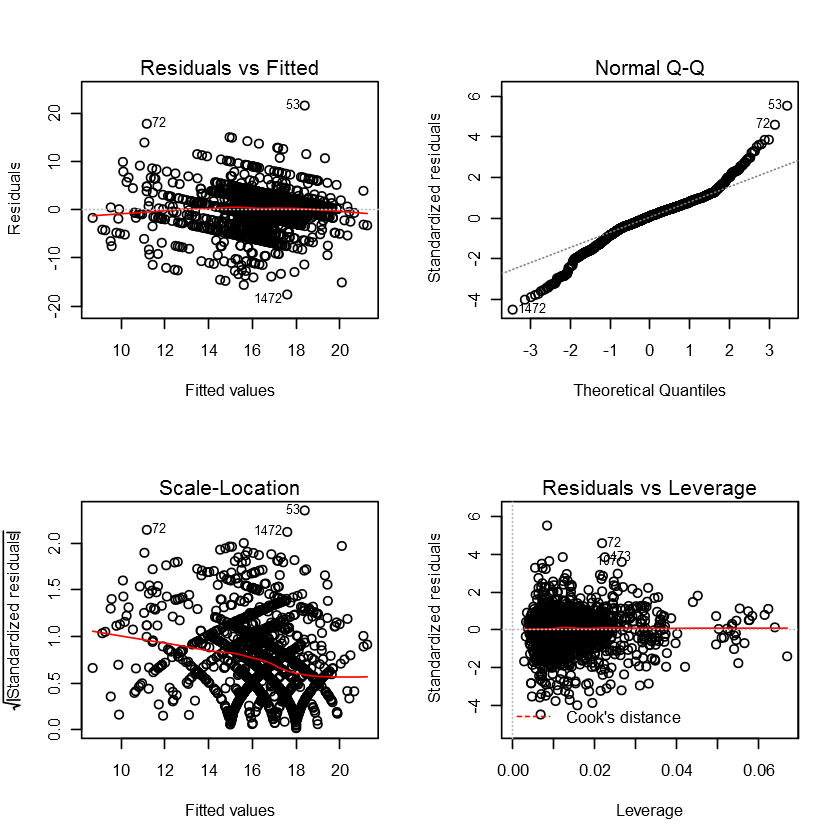

In [78]:
# To see all plots at once rather than 1 by 1
par(mfrow=c(2,2)) # change panel layout to 2x2
plot(fit)
par(mfrow=c(1,1)) # change layout back to 1x1

In [79]:
# Evaluate homoscedasticity / Breusch-Pagan test
ncvTest(fit)

Non-constant Variance Score Test 
Variance formula: ~ fitted.values 
Chisquare = 93.13315    Df = 1     p = 4.88919e-22 

The model seems to fail the homoscedasiticty assumption, could we tackle this problem be transforming our dependent y-variable, tip percentage?

In [80]:
# Transformation on PCTTIP - square root
df2 <- cbind(df, sqrt(df$pcttip))
df2[[4]] <- NULL

colnames(df2)[22] <- "pcttip" # fixes error as R cannot interpret the column name properly

formula_text2 <- paste(names(df2)[22], "~",
                      paste(names(df2[c(2:21)]), collapse="+"))
formula2 <- as.formula(formula_text2)

In [81]:
set.seed(12)
fit <- lm(formula2, data=df2)
summary(fit)


Call:
lm(formula = formula2, data = df2)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.1525 -0.1887  0.0698  0.3001  2.1786 

Coefficients:
                             Estimate Std. Error t value Pr(>|t|)    
(Intercept)                 4.4282311  3.4137515   1.297 0.194740    
State2                     -0.4381559  0.0598491  -7.321 3.71e-13 ***
State3                     -0.8805920  0.0704074 -12.507  < 2e-16 ***
ppbill                      0.0044798  0.0007070   6.336 2.98e-10 ***
flair                      -0.0450973  0.0143993  -3.132 0.001765 ** 
intro                      -0.0261577  0.0130827  -1.999 0.045716 *  
selling                     0.0339690  0.0160318   2.119 0.034241 *  
repeat.                    -0.0482198  0.0154154  -3.128 0.001788 ** 
customer_name               0.0287870  0.0168525   1.708 0.087779 .  
smile                      -0.0006593  0.0165653  -0.040 0.968256    
thanks                     -0.0126187  0.0119390  -1.057 0.290689    
Extravert

## Considering Race and Location

Recall that the data was very homogeneous in terms of worker race and location.

- About 90% of all observations are from the USA
- About 92% of all workers identified themselves as "White"

What if we removed these variables? Could we produce a model with a better R^2?

In [82]:
df3 <- df

df3$State <- NULL
df3$race <- NULL

formula_text3 <- paste(names(df3)[3], "~",
                      paste(names(df3[c(2,4:20)]), collapse="+"))
formula3 <- as.formula(formula_text3)

pcttip ~ ppbill + flair + intro + selling + repeat. + customer_name + 
    smile + thanks + Extraverted_enthusiastic + Critical_quarrelsome + 
    Dependable_selfdisciplined + Anxious_easily_upset + Reserved_quiet + 
    Sympathetic_warm + Disorganized_careless + Conventional_uncreative + 
    birth_yr + sex

In [83]:
# Model without worker race or state
set.seed(12)
fit <- lm(formula3, data=df3)
summary(fit)


Call:
lm(formula = formula3, data = df3)

Residuals:
     Min       1Q   Median       3Q      Max 
-17.4104  -1.8286   0.5923   2.5017  22.0200 

Coefficients:
                             Estimate Std. Error t value Pr(>|t|)    
(Intercept)                37.0604459 24.5978829   1.507  0.13208    
ppbill                      0.0253614  0.0050519   5.020 5.68e-07 ***
flair                      -0.2701710  0.1041474  -2.594  0.00956 ** 
intro                      -0.0677384  0.0939755  -0.721  0.47112    
selling                     0.2652131  0.1160584   2.285  0.02242 *  
repeat.                    -0.3505508  0.1114926  -3.144  0.00169 ** 
customer_name               0.2483160  0.1220396   2.035  0.04203 *  
smile                       0.0445883  0.1197993   0.372  0.70979    
thanks                     -0.1581955  0.0863929  -1.831  0.06725 .  
Extraverted_enthusiastic    0.0005053  0.0862455   0.006  0.99533    
Critical_quarrelsome        0.0599912  0.0652159   0.920  0.35776    

# Subset Regression

Lets utilize the subset regression function available in the "leaps" library to find the model that has the best R^2

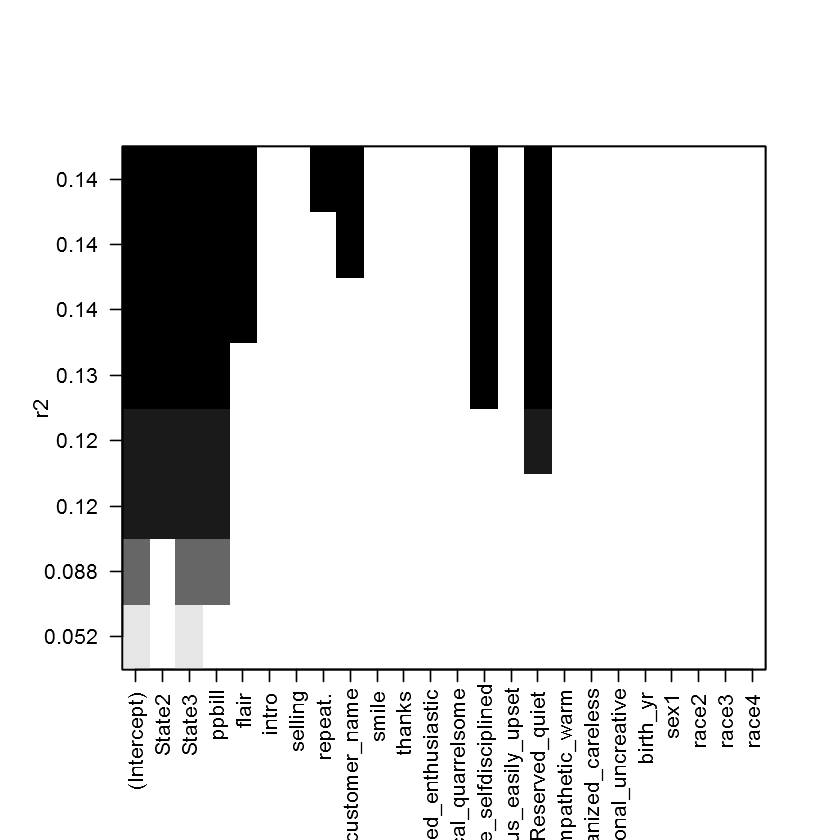

In [87]:
# Subsets Regression
leaps <- regsubsets(formula, data=df, nbest=1)
plot(leaps, scale="r2")

In [88]:
formula_textsub <- paste(names(df)[4], "~",
                        paste(names(df[c(2,3,5,8,9,14,16)]), collapse="+"))
formula4 <- as.formula(formula_textsub)
formula4
fit <- lm(formula4, data=df)
summary(fit)

pcttip ~ State + ppbill + flair + repeat. + customer_name + Dependable_selfdisciplined + 
    Reserved_quiet


Call:
lm(formula = formula4, data = df)

Residuals:
     Min       1Q   Median       3Q      Max 
-17.1959  -1.7708   0.3795   2.2209  21.5501 

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)    
(Intercept)                15.120915   0.710521  21.281  < 2e-16 ***
State2                     -3.240674   0.409671  -7.910 4.45e-15 ***
State3                     -5.542240   0.482257 -11.492  < 2e-16 ***
ppbill                      0.038686   0.004755   8.136 7.56e-16 ***
flair                      -0.314758   0.096378  -3.266  0.00111 ** 
repeat.                    -0.297372   0.104541  -2.845  0.00450 ** 
customer_name               0.339063   0.111181   3.050  0.00232 ** 
Dependable_selfdisciplined  0.291479   0.089628   3.252  0.00117 ** 
Reserved_quiet             -0.207153   0.052946  -3.913 9.47e-05 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 3.929 on 1790 degrees of freedom
Multiple R-squared:  0.1

## Compare results of different models

Let's take a look at information from all our regression models developed thus far.

**Lets see which attributes were significant in our regression analysis through the different models presented.**

![Significant Results](http://i.imgur.com/WWwS6mw.png)

**Lets take a look at the attributes that were significant 4 or 5 times. How did their results compare through simply visualizing the data?**

![Significant: Results Comparison](http://i.imgur.com/uJmcsUh.png)

**How about the non-significant results? Are they as agreeable?**

![Nonsignificant](http://i.imgur.com/HsYmr34.png)

## Conclusions and Closing Remarks

The results for both the visualization and regression methods were agreeable for the varaibles that were statistically significant in the regression models.

While the R^2 for all the models were extremely low, if the objective of this study was to simply **accurately predict** the change of tipping percentage, then the model would do a bad job.

- However, this wasn't the objective, we were more interested in seeing which variables were statistically significant to tipping percentage (and how they correlated)

This dataset does however provide a good lesson on response bias - the dataset was entirely collected from the responses of workers around the world. Many of the questions asked required the responser (i.e. the restaurant worker) to answer accurately to the best of their ability
- They had to describe their traits, such as enthusiastic, anxious, and careless
    - Would people be comfortable rating themselves high on traits such as 'easily upset', 'quarrelsome' and 'uncreative'?
    - If they were unsure, would a majority choose the 'neutral' option (so a '4' when the options were 1 to 7)
- They had to estimate the proportion of customers that visited their restaurants
- They needed to give an 'average' tip percentage and per person bill

Finally these results could potentially only apply to white restaurant workers located in the US due to the extremely high response from this demographic.